# 3D Multi-class Segmentation with UNETR  (Muscle, Fat (subcut and internal), psoas,Cavity,BGD)

## Setup environment

In [1]:
!pip install -q "monai-weekly[nibabel, tqdm, einops]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

In [2]:
import os
import shutil
import tempfile

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
    EnsureChannelFirstd,
    AddChanneld,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandFlipd,
    RandCropByPosNegLabeld,
    RandShiftIntensityd,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    RandRotate90d,
    ToTensord,
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import UNETR

from monai.data import (
    DataLoader,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
)


import torch

print_config()

MONAI version: 0.10.dev2231
Numpy version: 1.23.1
Pytorch version: 1.12.0+cu102
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 8236821c099e5997f7ad0410c5374e4472f4ed14
MONAI __file__: /home/adminbthomas/miniconda3/envs/PT02/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.9
Nibabel version: 4.0.1
scikit-image version: 0.19.3
Pillow version: 9.2.0
Tensorboard version: 2.9.1
gdown version: 4.5.1
TorchVision version: 0.13.0+cu102
tqdm version: 4.64.0
lmdb version: 1.3.0
psutil version: 5.9.1
pandas version: 1.4.3
einops version: 0.4.1
transformers version: 4.20.1
mlflow version: 1.27.0
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



## Setup data directory
  


In [3]:
# directory = os.environ.get("MONAI_DATA_DIRECTORY")
root_dir = "/home/adminbthomas/Downloads/ensemble/unetr"# root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

/home/adminbthomas/Downloads/ensemble/unetr


## Setup transforms for training and validation

In [4]:
import datetime
import time

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=0,
            a_max=250,
            b_min=0.0,
            b_max=1.0,
            clip=False,   # change-intermedouts 
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 16),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[0],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[1],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[2],
            prob=0.10,
        ),
        RandRotate90d(
            keys=["image", "label"],
            prob=0.10,
            max_k=3,
        ),
        RandShiftIntensityd(
            keys=["image"],
            offsets=0.10,
            prob=0.50,
        ),
        ToTensord(keys=["image", "label"]),
#         SaveImaged(keys="image", meta_keys="image_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
#         SaveImaged(keys="label", meta_keys="label_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250, b_min=0.0, b_max=1.0, clip=False
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        ToTensord(keys=["image", "label"]),
    ]
)

### DATA

In [5]:
data_dir = os.path.join(root_dir,"../data/")

In [6]:
split_JSON = "dataset_MR09fold2.json"
datasets = data_dir + split_JSON
datalist = load_decathlon_datalist(datasets, True, "training")
val_files = load_decathlon_datalist(datasets, True, "validation")
train_ds = CacheDataset(
    data=datalist,
    transform=train_transforms,
    cache_num=24,
    cache_rate=1.0,
    num_workers=8,
)
train_loader = DataLoader(
    train_ds, batch_size=1, shuffle=True, num_workers=8, pin_memory=True
)
val_ds = CacheDataset(
    data=val_files, transform=val_transforms, cache_num=6, cache_rate=1.0, num_workers=4
)
val_loader = DataLoader(
    val_ds, batch_size=1, shuffle=False, num_workers=4, pin_memory=True
)

Loading dataset:   0%|                                                                                                                                                       | 0/12 [00:00<?, ?it/s]Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Loading dataset: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  7.40it/s]


## Check data shape and visualize

image shape: torch.Size([1, 250, 172, 49]), label shape: torch.Size([1, 250, 172, 49])


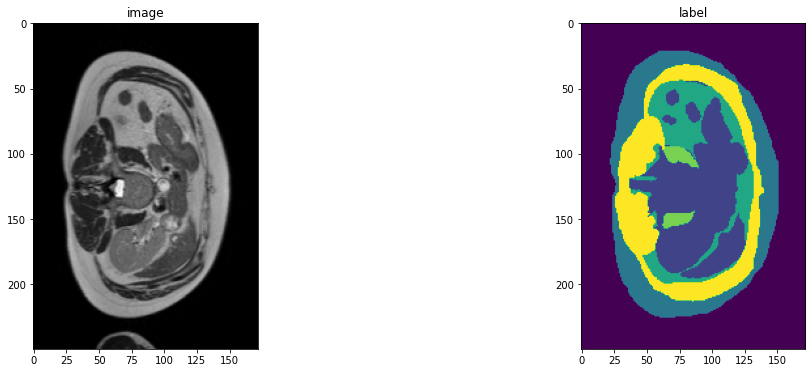

In [7]:
slice_map = {
    "A037_v1_T2W.nii.gz": 10,
    "A037_v1_T2W.nii.gz": 8,
    "A037_v1_T2W.nii.gz": 6
}
case_num = 1
img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
img = val_ds[case_num]["image"]
label = val_ds[case_num]["label"]
img_shape = img.shape
label_shape = label.shape
print(f"image shape: {img_shape}, label shape: {label_shape}")
plt.figure("image", (18, 6))
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(img[0, :, :, slice_map[img_name]].detach().cpu(), cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(label[0, :, :, slice_map[img_name]].detach().cpu())
plt.show()

### Create Model, Loss, Optimizer


In [5]:
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda:1")

model = UNETR(
    in_channels=1,
    out_channels=6,
    img_size=(96, 96, 16),
    feature_size=16,
    hidden_size=768,
    mlp_dim=3072,
    num_heads=12,
    pos_embed="perceptron",
    norm_name="instance",
    res_block=True,
    dropout_rate=0.0,
).to(device)

loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
torch.backends.cudnn.benchmark = True
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

### Execute a typical PyTorch training process

In [9]:
def validation(epoch_iterator_val):
    model.eval()
    dice_vals = list()
    with torch.no_grad():
        for step, batch in enumerate(epoch_iterator_val):
            val_inputs, val_labels = (batch["image"].to(device), batch["label"].to(device))
            val_outputs = sliding_window_inference(val_inputs, (96, 96, 16), 4, model)
            val_labels_list = decollate_batch(val_labels)
            val_labels_convert = [
                post_label(val_label_tensor) for val_label_tensor in val_labels_list
            ]
            val_outputs_list = decollate_batch(val_outputs)
            val_output_convert = [
                post_pred(val_pred_tensor) for val_pred_tensor in val_outputs_list
            ]
            dice_metric(y_pred=val_output_convert, y=val_labels_convert)
            dice = dice_metric.aggregate().item()
            dice_vals.append(dice)
            epoch_iterator_val.set_description(
                "Validate (%d / %d Steps) (dice=%2.5f)" % (global_step, 10.0, dice)
            )
        dice_metric.reset()
    mean_dice_val = np.mean(dice_vals)
    return mean_dice_val


def train(global_step, train_loader, dice_val_best, global_step_best):
    model.train()
    epoch_loss = 0
    step = 0
    epoch_iterator = tqdm(
        train_loader, desc="Training (X / X Steps) (loss=X.X)", dynamic_ncols=True
    )
    for step, batch in enumerate(epoch_iterator):
        step += 1
        x, y = (batch["image"].to(device), batch["label"].to(device))
#         print(x.shape)
#         print(y.shape)
#         plt.figure("image", (18, 6))
#         plt.subplot(1, 2, 1)
#         plt.title("image")
#         plt.imshow(x[3,0,:,:,4].detach().cpu(), cmap="gray")
#         plt.subplot(1, 2, 2)
#         plt.title("label")
#         plt.imshow(y[3,0,:,:,4].detach().cpu())
#         plt.show()
        logit_map = model(x)
        loss = loss_function(logit_map, y)
        loss.backward()
        epoch_loss += loss.item()
        optimizer.step()
        optimizer.zero_grad()
        epoch_iterator.set_description(
            "Training (%d / %d Steps) (loss=%2.5f)" % (global_step, max_iterations, loss)
        )
        if (
            global_step % eval_num == 0 and global_step != 0
        ) or global_step == max_iterations:
            epoch_iterator_val = tqdm(
                val_loader, desc="Validate (X / X Steps) (dice=X.X)", dynamic_ncols=True
            )
            dice_val = validation(epoch_iterator_val)
            epoch_loss /= step
            epoch_loss_values.append(epoch_loss)
            metric_values.append(dice_val)
            if dice_val > dice_val_best:
                dice_val_best = dice_val
                global_step_best = global_step
                torch.save(
                    model.state_dict(), os.path.join(root_dir, "TestMR09_unetrensemble_fold2.pth")
                )
                print(
                    "Model Was Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
            else:
                print(
                    "Model Was Not Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
        global_step += 1
        
    return global_step, dice_val_best, global_step_best


max_iterations = 70000
eval_num = 250
post_label = AsDiscrete(to_onehot=6)
post_pred = AsDiscrete(argmax=True, to_onehot=6)
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)
global_step = 0
dice_val_best = 0.0
global_step_best = 0
epoch_loss_values = []
metric_values = []
while global_step < max_iterations:
    global_step, dice_val_best, global_step_best = train(
        global_step, train_loader, dice_val_best, global_step_best
    )
#     print('I am waiting....')
#     time.sleep(1)
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold2.pth")))

Training (251 / 70000 Steps) (loss=1.43829): 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.00it/s]

Model Was Saved ! Current Best Avg. Dice: 0.5640406012535095 Current Avg. Dice: 0.5640406012535095


Training (501 / 70000 Steps) (loss=1.31730):  83%|███████████████████████████████████████████████████████████████████████████████████████████████                   | 10/12 [00:03<00:01,  1.94it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6149251461029053 Current Avg. Dice: 0.6149251461029053


Training (751 / 70000 Steps) (loss=1.02959):  67%|████████████████████████████████████████████████████████████████████████████▋                                      | 8/12 [00:03<00:02,  1.77it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6361584862073263 Current Avg. Dice: 0.6361584862073263


Training (1001 / 70000 Steps) (loss=1.08067):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.63it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6431333223978678 Current Avg. Dice: 0.6431333223978678


Training (1251 / 70000 Steps) (loss=0.91064):  33%|██████████████████████████████████████                                                                            | 4/12 [00:03<00:05,  1.41it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6587082346280416 Current Avg. Dice: 0.6587082346280416


Training (1501 / 70000 Steps) (loss=1.00736):  17%|███████████████████                                                                                               | 2/12 [00:02<00:11,  1.18s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6592036883036295 Current Avg. Dice: 0.6592036883036295


Training (1751 / 70000 Steps) (loss=1.19964): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.93it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6659635305404663 Current Avg. Dice: 0.6659635305404663


Training (2001 / 70000 Steps) (loss=1.32764):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:01,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6775927146275839 Current Avg. Dice: 0.6775927146275839


Training (2251 / 70000 Steps) (loss=0.59482):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.86it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6778139670689901 Current Avg. Dice: 0.6778139670689901


Training (2501 / 70000 Steps) (loss=1.22436):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.71it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6897527575492859 Current Avg. Dice: 0.6897527575492859


Training (2751 / 70000 Steps) (loss=0.74945):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.78it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6897527575492859 Current Avg. Dice: 0.6885691086451212


Training (3001 / 70000 Steps) (loss=0.95655):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.09s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6974309682846069 Current Avg. Dice: 0.6974309682846069


Training (3251 / 70000 Steps) (loss=0.98523): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.91it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7035854856173197 Current Avg. Dice: 0.7035854856173197


Training (3501 / 70000 Steps) (loss=0.81459):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:01,  1.87it/s]

Model Was Saved ! Current Best Avg. Dice: 0.704642653465271 Current Avg. Dice: 0.704642653465271


Training (3751 / 70000 Steps) (loss=0.58510):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.80it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7144461274147034 Current Avg. Dice: 0.7144461274147034


Training (4001 / 70000 Steps) (loss=0.55353):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.73it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7163456082344055 Current Avg. Dice: 0.7163456082344055


Training (4251 / 70000 Steps) (loss=0.89233):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.82it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7163456082344055 Current Avg. Dice: 0.7095504005750021


Training (4501 / 70000 Steps) (loss=0.58875):  17%|███████████████████                                                                                               | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7163456082344055 Current Avg. Dice: 0.716252326965332


Training (4751 / 70000 Steps) (loss=0.59090): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7163456082344055 Current Avg. Dice: 0.7053971290588379


Training (5001 / 70000 Steps) (loss=0.63091):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7163456082344055 Current Avg. Dice: 0.7095694343249003


Training (5251 / 70000 Steps) (loss=0.85661):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:01,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7163456082344055 Current Avg. Dice: 0.7143652240435282


Training (5501 / 70000 Steps) (loss=0.55729):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7163456082344055 Current Avg. Dice: 0.7077613472938538


Training (5751 / 70000 Steps) (loss=0.49009):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.39it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7188012003898621 Current Avg. Dice: 0.7188012003898621


Training (6001 / 70000 Steps) (loss=0.73549):  17%|███████████████████                                                                                               | 2/12 [00:02<00:11,  1.15s/it]

Model Was Saved ! Current Best Avg. Dice: 0.7201087673505148 Current Avg. Dice: 0.7201087673505148


Training (6251 / 70000 Steps) (loss=0.83158): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.91it/s]

Model Was Saved ! Current Best Avg. Dice: 0.73630424340566 Current Avg. Dice: 0.73630424340566


Training (6501 / 70000 Steps) (loss=0.65182):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:01,  1.87it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7633663415908813 Current Avg. Dice: 0.7633663415908813


Training (6751 / 70000 Steps) (loss=0.64816):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:01,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7633663415908813 Current Avg. Dice: 0.7440326611200968


Training (7001 / 70000 Steps) (loss=0.61178):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.66it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8145015239715576 Current Avg. Dice: 0.8145015239715576


Training (7251 / 70000 Steps) (loss=0.43777):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.41it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8333280483881632 Current Avg. Dice: 0.8333280483881632


Training (7501 / 70000 Steps) (loss=0.97214):  17%|███████████████████                                                                                               | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8333280483881632 Current Avg. Dice: 0.8304373621940613


Training (7751 / 70000 Steps) (loss=0.68445): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8333280483881632 Current Avg. Dice: 0.820476233959198


Training (8001 / 70000 Steps) (loss=0.41570):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:01,  1.90it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8548945983250936 Current Avg. Dice: 0.8548945983250936


Training (8251 / 70000 Steps) (loss=0.60013):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.84it/s]

Model Was Saved ! Current Best Avg. Dice: 0.859501838684082 Current Avg. Dice: 0.859501838684082


Training (8501 / 70000 Steps) (loss=0.51488):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.859501838684082 Current Avg. Dice: 0.8574027220408121


Training (8751 / 70000 Steps) (loss=0.39291):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.80it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.859501838684082 Current Avg. Dice: 0.8481443325678507


Training (9001 / 70000 Steps) (loss=0.55482):  17%|███████████████████                                                                                               | 2/12 [00:02<00:09,  1.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.859501838684082 Current Avg. Dice: 0.8536674578984579


Training (9251 / 70000 Steps) (loss=0.70769): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.41it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.859501838684082 Current Avg. Dice: 0.849811851978302


Training (9501 / 70000 Steps) (loss=0.53688):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.859501838684082 Current Avg. Dice: 0.8544354240099589


Training (9751 / 70000 Steps) (loss=0.93391):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.81it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8750763535499573


Training (10001 / 70000 Steps) (loss=0.68413):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.02it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8553151488304138


Training (10251 / 70000 Steps) (loss=0.76156):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.81it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8748545447985331


Training (10501 / 70000 Steps) (loss=0.49034):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8609418471654257


Training (10751 / 70000 Steps) (loss=0.53694): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8449321190516154


Training (11001 / 70000 Steps) (loss=0.49304):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8739604155222574


Training (11251 / 70000 Steps) (loss=0.47617):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8551206588745117


Training (11501 / 70000 Steps) (loss=0.43363):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8601192831993103


Training (11751 / 70000 Steps) (loss=0.33101):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.78it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8630443414052328


Training (12001 / 70000 Steps) (loss=0.35938):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8750763535499573 Current Avg. Dice: 0.8527618050575256


Training (12251 / 70000 Steps) (loss=0.67629): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8831380009651184


Training (12501 / 70000 Steps) (loss=0.37756):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8695287704467773


Training (12751 / 70000 Steps) (loss=0.66819):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8678932984670004


Training (13001 / 70000 Steps) (loss=0.50053):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8815079728762308


Training (13251 / 70000 Steps) (loss=0.34598):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.81it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8574921290079752


Training (13501 / 70000 Steps) (loss=0.80167):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8816795547803243


Training (13751 / 70000 Steps) (loss=0.50117): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.45it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8813590010007223


Training (14001 / 70000 Steps) (loss=0.54620):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.44it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8713094592094421


Training (14251 / 70000 Steps) (loss=0.62890):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8520193099975586


Training (14501 / 70000 Steps) (loss=0.57898):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8723414142926534


Training (14751 / 70000 Steps) (loss=0.40119):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.78it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8831380009651184 Current Avg. Dice: 0.8685908714930216


Training (15001 / 70000 Steps) (loss=0.44244):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:11,  1.11s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8875662485758463


Training (15251 / 70000 Steps) (loss=0.37931): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8719842632611593


Training (15501 / 70000 Steps) (loss=0.52248):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.875071664651235


Training (15751 / 70000 Steps) (loss=0.37737):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8715400894482931


Training (16001 / 70000 Steps) (loss=0.44074):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8414668838183085


Training (16251 / 70000 Steps) (loss=0.49812):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.879582405090332


Training (16501 / 70000 Steps) (loss=0.51590):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.866583247979482


Training (16751 / 70000 Steps) (loss=0.44013): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8714770277341207


Training (17001 / 70000 Steps) (loss=0.30612):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.38it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8698522448539734


Training (17251 / 70000 Steps) (loss=0.42559):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8549968798955282


Training (17501 / 70000 Steps) (loss=0.36658):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8867897788683573


Training (17751 / 70000 Steps) (loss=0.40510):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.71it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8815682927767435


Training (18001 / 70000 Steps) (loss=0.52461):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8841659625371298


Training (18251 / 70000 Steps) (loss=0.47354): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8788085381189982


Training (18501 / 70000 Steps) (loss=0.38734):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8875662485758463 Current Avg. Dice: 0.8628206253051758


Training (18751 / 70000 Steps) (loss=0.40618):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.81it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8910328149795532 Current Avg. Dice: 0.8910328149795532


Training (19001 / 70000 Steps) (loss=0.70983):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8910328149795532 Current Avg. Dice: 0.8859365781148275


Training (19251 / 70000 Steps) (loss=0.41722):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.71it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8910328149795532 Current Avg. Dice: 0.8865795930226644


Training (19501 / 70000 Steps) (loss=0.36557):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:11,  1.13s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8974257111549377


Training (19751 / 70000 Steps) (loss=0.28825): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.45it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8732181588808695


Training (20001 / 70000 Steps) (loss=0.38087):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.38it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8941891392072042


Training (20251 / 70000 Steps) (loss=0.31839):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8791882594426473


Training (20501 / 70000 Steps) (loss=0.44798):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8758485913276672


Training (20751 / 70000 Steps) (loss=0.25974):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.71it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8875916004180908


Training (21001 / 70000 Steps) (loss=0.58054):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8787472446759542


Training (21251 / 70000 Steps) (loss=0.67074): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.50it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8650907874107361


Training (21501 / 70000 Steps) (loss=0.34304):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8875071803728739


Training (21751 / 70000 Steps) (loss=0.30358):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8837644855181376


Training (22001 / 70000 Steps) (loss=0.42122):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.05it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8709521094957987


Training (22251 / 70000 Steps) (loss=0.46295):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.81it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8841110269228617


Training (22501 / 70000 Steps) (loss=0.32845):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8974257111549377 Current Avg. Dice: 0.8892046411832174


Training (22751 / 70000 Steps) (loss=0.43259): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.95it/s]

Model Was Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.901685893535614


Training (23001 / 70000 Steps) (loss=0.54413):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8967060049374899


Training (23251 / 70000 Steps) (loss=0.39961):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.882827619711558


Training (23501 / 70000 Steps) (loss=0.64219):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8824188907941183


Training (23751 / 70000 Steps) (loss=0.41482):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8896480202674866


Training (24001 / 70000 Steps) (loss=0.57480):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8841367761294047


Training (24251 / 70000 Steps) (loss=0.40631): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8939609924952189


Training (24501 / 70000 Steps) (loss=0.34896):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8784128228823344


Training (24751 / 70000 Steps) (loss=0.30031):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8918775121370951


Training (25001 / 70000 Steps) (loss=0.33681):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8806164662043253


Training (25251 / 70000 Steps) (loss=0.31380):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.78it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8779558539390564


Training (25501 / 70000 Steps) (loss=0.38166):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.892052173614502


Training (25751 / 70000 Steps) (loss=0.34568): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8924375375111898


Training (26001 / 70000 Steps) (loss=0.40676):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8843313058217367


Training (26251 / 70000 Steps) (loss=0.35177):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8934822281201681


Training (26501 / 70000 Steps) (loss=0.44062):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8886794447898865


Training (26751 / 70000 Steps) (loss=0.33997):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.75it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8878431518872579


Training (27001 / 70000 Steps) (loss=0.32223):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8907644748687744


Training (27251 / 70000 Steps) (loss=0.43428): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8914923667907715


Training (27501 / 70000 Steps) (loss=0.47765):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.41it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.892397940158844


Training (27751 / 70000 Steps) (loss=0.59057):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8940386772155762


Training (28001 / 70000 Steps) (loss=0.41632):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.9016139705975851


Training (28251 / 70000 Steps) (loss=0.46706):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.73it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8827917377154032


Training (28501 / 70000 Steps) (loss=0.35823):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8937350710233053


Training (28751 / 70000 Steps) (loss=0.45968): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.878176232179006


Training (29001 / 70000 Steps) (loss=0.41930):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.41it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.881396492322286


Training (29251 / 70000 Steps) (loss=0.21451):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8877437512079874


Training (29501 / 70000 Steps) (loss=0.49874):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.9009077946345011


Training (29751 / 70000 Steps) (loss=0.29774):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8950404127438863


Training (30001 / 70000 Steps) (loss=0.38613):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8925488988558451


Training (30251 / 70000 Steps) (loss=0.36889): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8920029799143473


Training (30501 / 70000 Steps) (loss=0.29885):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8884304364522299


Training (30751 / 70000 Steps) (loss=0.31060):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8946175575256348


Training (31001 / 70000 Steps) (loss=0.46860):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8909979462623596


Training (31251 / 70000 Steps) (loss=0.22477):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.81it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8968157966931661


Training (31501 / 70000 Steps) (loss=0.42630):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.893455704053243


Training (31751 / 70000 Steps) (loss=0.32492): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8824372092882792


Training (32001 / 70000 Steps) (loss=0.30217):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.45it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.900246779123942


Training (32251 / 70000 Steps) (loss=0.55048):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.9001516501108805


Training (32501 / 70000 Steps) (loss=0.27148):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8943126400311788


Training (32751 / 70000 Steps) (loss=0.31590):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.896270751953125


Training (33001 / 70000 Steps) (loss=0.37771):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8724024891853333


Training (33251 / 70000 Steps) (loss=0.48774): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8971470594406128


Training (33501 / 70000 Steps) (loss=0.36641):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8887103398640951


Training (33751 / 70000 Steps) (loss=0.38402):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.31it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8942997455596924


Training (34001 / 70000 Steps) (loss=0.73005):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8904011050860087


Training (34251 / 70000 Steps) (loss=0.65153):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.83it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8959092100461324


Training (34501 / 70000 Steps) (loss=0.48840):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.05it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8908304770787557


Training (34751 / 70000 Steps) (loss=0.32344): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8877750039100647


Training (35001 / 70000 Steps) (loss=0.38277):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8808582226435343


Training (35251 / 70000 Steps) (loss=0.30611):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.27it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8987698753674825


Training (35501 / 70000 Steps) (loss=0.24336):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8952637314796448


Training (35751 / 70000 Steps) (loss=0.41396):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.75it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8936032056808472


Training (36001 / 70000 Steps) (loss=0.34464):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8878052433331808


Training (36251 / 70000 Steps) (loss=0.31469): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.41it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8901024460792542


Training (36501 / 70000 Steps) (loss=0.39553):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.38it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8842128316561381


Training (36751 / 70000 Steps) (loss=0.42114):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8877026240030924


Training (37001 / 70000 Steps) (loss=0.36066):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.9007112185160319


Training (37251 / 70000 Steps) (loss=0.39287):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.85it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8930040200551351


Training (37501 / 70000 Steps) (loss=0.19640):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.05it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8894518415133158


Training (37751 / 70000 Steps) (loss=0.29494): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901685893535614 Current Avg. Dice: 0.8844781716664633


Training (38001 / 70000 Steps) (loss=0.25984):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:01,  1.85it/s]

Model Was Saved ! Current Best Avg. Dice: 0.901741087436676 Current Avg. Dice: 0.901741087436676


Training (38251 / 70000 Steps) (loss=0.31311):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901741087436676 Current Avg. Dice: 0.8924212455749512


Training (38501 / 70000 Steps) (loss=0.35702):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901741087436676 Current Avg. Dice: 0.8973870476086935


Training (38751 / 70000 Steps) (loss=0.31277):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.82it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901741087436676 Current Avg. Dice: 0.8798031210899353


Training (39001 / 70000 Steps) (loss=0.30650):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901741087436676 Current Avg. Dice: 0.8994554877281189


Training (39251 / 70000 Steps) (loss=0.32381): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901741087436676 Current Avg. Dice: 0.8876871267954508


Training (39501 / 70000 Steps) (loss=0.17707):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.901741087436676 Current Avg. Dice: 0.8871224721272787


Training (39751 / 70000 Steps) (loss=0.45920):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.83it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9023242394129435 Current Avg. Dice: 0.9023242394129435


Training (40001 / 70000 Steps) (loss=0.26289):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.72it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.9024035731951395


Training (40251 / 70000 Steps) (loss=0.44209):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.76it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8951917886734009


Training (40501 / 70000 Steps) (loss=0.64560):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8972588578859965


Training (40751 / 70000 Steps) (loss=0.55785): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8911596139272054


Training (41001 / 70000 Steps) (loss=0.30011):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.31it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8967756628990173


Training (41251 / 70000 Steps) (loss=0.25463):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.39it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8819431662559509


Training (41501 / 70000 Steps) (loss=0.24694):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8902451992034912


Training (41751 / 70000 Steps) (loss=0.32579):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.76it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8765700459480286


Training (42001 / 70000 Steps) (loss=0.28243):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8937893311182658


Training (42251 / 70000 Steps) (loss=0.55010): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.45it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8957905570665995


Training (42501 / 70000 Steps) (loss=0.28230):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.8924551606178284


Training (42751 / 70000 Steps) (loss=0.42396):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9024035731951395 Current Avg. Dice: 0.893777052561442


Training (43001 / 70000 Steps) (loss=0.29208):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.67it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9049168229103088


Training (43251 / 70000 Steps) (loss=0.26859):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.77it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9000623822212219


Training (43501 / 70000 Steps) (loss=0.28839):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8971734642982483


Training (43751 / 70000 Steps) (loss=0.49712): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.37it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8865060210227966


Training (44001 / 70000 Steps) (loss=0.39222):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.38it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8987678090731303


Training (44251 / 70000 Steps) (loss=0.27932):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8945621450742086


Training (44501 / 70000 Steps) (loss=0.29344):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8953967690467834


Training (44751 / 70000 Steps) (loss=0.29174):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.84it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8948559761047363


Training (45001 / 70000 Steps) (loss=0.26301):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.06it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8975988229115804


Training (45251 / 70000 Steps) (loss=0.33352): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.48it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8892797827720642


Training (45501 / 70000 Steps) (loss=0.49364):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8990627924601237


Training (45751 / 70000 Steps) (loss=0.31482):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8949282169342041


Training (46001 / 70000 Steps) (loss=0.27983):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8864742716153463


Training (46251 / 70000 Steps) (loss=0.50138):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.899795651435852


Training (46501 / 70000 Steps) (loss=0.16257):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8918104966481527


Training (46751 / 70000 Steps) (loss=0.35147): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.44it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8984576463699341


Training (47001 / 70000 Steps) (loss=0.50505):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8912896911303202


Training (47251 / 70000 Steps) (loss=0.50267):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.27it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8865237633387247


Training (47501 / 70000 Steps) (loss=0.34475):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8956912954648336


Training (47751 / 70000 Steps) (loss=0.23530):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.80it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8943769931793213


Training (48001 / 70000 Steps) (loss=0.29586):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8963948885599772


Training (48251 / 70000 Steps) (loss=0.33791): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8935452699661255


Training (48501 / 70000 Steps) (loss=0.26894):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.37it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8984220226605734


Training (48751 / 70000 Steps) (loss=0.28292):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8818930387496948


Training (49001 / 70000 Steps) (loss=0.23202):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.897407591342926


Training (49251 / 70000 Steps) (loss=0.24905):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.69it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8946945071220398


Training (49501 / 70000 Steps) (loss=0.42973):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9027003645896912


Training (49751 / 70000 Steps) (loss=0.35231): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.50it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8986191749572754


Training (50001 / 70000 Steps) (loss=0.25624):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8999456564585367


Training (50251 / 70000 Steps) (loss=0.35131):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.31it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9007468819618225


Training (50501 / 70000 Steps) (loss=0.39133):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8947916030883789


Training (50751 / 70000 Steps) (loss=0.39057):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.79it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9047438502311707


Training (51001 / 70000 Steps) (loss=0.35031):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9006418585777283


Training (51251 / 70000 Steps) (loss=0.31418): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8921172420183817


Training (51501 / 70000 Steps) (loss=0.26718):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.41it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8892710407574972


Training (51751 / 70000 Steps) (loss=0.28784):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8918582399686178


Training (52001 / 70000 Steps) (loss=0.24915):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8979737758636475


Training (52251 / 70000 Steps) (loss=0.27966):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.80it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9007805784543356


Training (52501 / 70000 Steps) (loss=0.51861):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8995216091473898


Training (52751 / 70000 Steps) (loss=0.34065): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8970468242963155


Training (53001 / 70000 Steps) (loss=0.28139):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8856082558631897


Training (53251 / 70000 Steps) (loss=0.66147):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.31it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8963673114776611


Training (53501 / 70000 Steps) (loss=0.28792):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9041594664255778


Training (53751 / 70000 Steps) (loss=0.23436):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.73it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8946350614229838


Training (54001 / 70000 Steps) (loss=0.27584):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8996981978416443


Training (54251 / 70000 Steps) (loss=0.29631): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8942637840906779


Training (54501 / 70000 Steps) (loss=0.31712):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.48it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8938324451446533


Training (54751 / 70000 Steps) (loss=0.27196):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8912602265675863


Training (55001 / 70000 Steps) (loss=0.30760):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.06it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8978489438692728


Training (55251 / 70000 Steps) (loss=0.27700):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.76it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8966567913691202


Training (55501 / 70000 Steps) (loss=0.46878):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8982819120089213


Training (55751 / 70000 Steps) (loss=0.26983): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8851308226585388


Training (56001 / 70000 Steps) (loss=0.37503):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8910939494768778


Training (56251 / 70000 Steps) (loss=0.23178):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9010797142982483


Training (56501 / 70000 Steps) (loss=0.44954):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8919059634208679


Training (56751 / 70000 Steps) (loss=0.31861):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.77it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8980035185813904


Training (57001 / 70000 Steps) (loss=0.31872):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8922055164972941


Training (57251 / 70000 Steps) (loss=0.34580): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8949436942736307


Training (57501 / 70000 Steps) (loss=0.36630):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8850678404172262


Training (57751 / 70000 Steps) (loss=0.38006):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.25it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9043107827504476


Training (58001 / 70000 Steps) (loss=0.26967):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8946476380030314


Training (58251 / 70000 Steps) (loss=0.28318):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.81it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8958112597465515


Training (58501 / 70000 Steps) (loss=0.23636):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8929967085520426


Training (58751 / 70000 Steps) (loss=0.41199): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8905039230982462


Training (59001 / 70000 Steps) (loss=0.21433):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.45it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8961098988850912


Training (59251 / 70000 Steps) (loss=0.24519):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8947663307189941


Training (59501 / 70000 Steps) (loss=0.24353):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8874070644378662


Training (59751 / 70000 Steps) (loss=0.29521):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.76it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.897463838259379


Training (60001 / 70000 Steps) (loss=0.29094):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8938570221265157


Training (60251 / 70000 Steps) (loss=0.25018): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8967084089914957


Training (60501 / 70000 Steps) (loss=0.34754):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.39it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8990147709846497


Training (60751 / 70000 Steps) (loss=0.27205):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8973838885625204


Training (61001 / 70000 Steps) (loss=0.36895):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.894113818804423


Training (61251 / 70000 Steps) (loss=0.28484):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.71it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8866237799326578


Training (61501 / 70000 Steps) (loss=0.30145):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8986534674962362


Training (61751 / 70000 Steps) (loss=0.30455): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.39it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8972692290941874


Training (62001 / 70000 Steps) (loss=0.28736):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9037582675615946


Training (62251 / 70000 Steps) (loss=0.28859):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.31it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8926510214805603


Training (62501 / 70000 Steps) (loss=0.37702):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9012527465820312


Training (62751 / 70000 Steps) (loss=0.28620):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.74it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9026200175285339


Training (63001 / 70000 Steps) (loss=0.21857):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9030314485232035


Training (63251 / 70000 Steps) (loss=0.28474): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.50it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8958618640899658


Training (63501 / 70000 Steps) (loss=0.21366):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.38it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8915624618530273


Training (63751 / 70000 Steps) (loss=0.36492):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8945666948954264


Training (64001 / 70000 Steps) (loss=0.31215):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8966634074846903


Training (64251 / 70000 Steps) (loss=0.23136):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.81it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8897217114766439


Training (64501 / 70000 Steps) (loss=0.38816):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.05it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8965104023615519


Training (64751 / 70000 Steps) (loss=0.28025): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8931681513786316


Training (65001 / 70000 Steps) (loss=0.35410):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.48it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8986112276713053


Training (65251 / 70000 Steps) (loss=0.29863):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9041613737742106


Training (65501 / 70000 Steps) (loss=0.33159):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8991156617800394


Training (65751 / 70000 Steps) (loss=0.19737):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.81it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8988818327585856


Training (66001 / 70000 Steps) (loss=0.22769):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8916475574175516


Training (66251 / 70000 Steps) (loss=0.21422): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.37it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9047508041063944


Training (66501 / 70000 Steps) (loss=0.40691):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9027996857961019


Training (66751 / 70000 Steps) (loss=0.27531):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9047929247220358


Training (67001 / 70000 Steps) (loss=0.32766):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.897656242052714


Training (67251 / 70000 Steps) (loss=0.25284):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.75it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.890424887339274


Training (67501 / 70000 Steps) (loss=0.31741):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.06it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9010613759358724


Training (67751 / 70000 Steps) (loss=0.40565): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.48it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9038081963857015


Training (68001 / 70000 Steps) (loss=0.35109):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9043762485186259


Training (68251 / 70000 Steps) (loss=0.28169):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.31it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.8991701602935791


Training (68501 / 70000 Steps) (loss=0.29687):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9040064016977946


Training (68751 / 70000 Steps) (loss=0.29933):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.82it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9045111536979675


Training (69001 / 70000 Steps) (loss=0.25959):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9032760262489319


Training (69251 / 70000 Steps) (loss=0.30643): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049168229103088 Current Avg. Dice: 0.9036043683687845


Training (69501 / 70000 Steps) (loss=0.24082):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:01,  1.86it/s]

Model Was Saved ! Current Best Avg. Dice: 0.9049367507298788 Current Avg. Dice: 0.9049367507298788


Training (69751 / 70000 Steps) (loss=0.35537):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.31it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049367507298788 Current Avg. Dice: 0.9006978869438171


Training (70001 / 70000 Steps) (loss=0.45540):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.83it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.9049367507298788 Current Avg. Dice: 0.9008795221646627


Training (70007 / 70000 Steps) (loss=0.34449): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.99it/s]


<All keys matched successfully>

In [10]:
print(
    f"train completed, best_metric: {dice_val_best:.4f} "
    f"at iteration: {global_step_best}"
)

train completed, best_metric: 0.9049 at iteration: 69500


### Plot the loss and metric

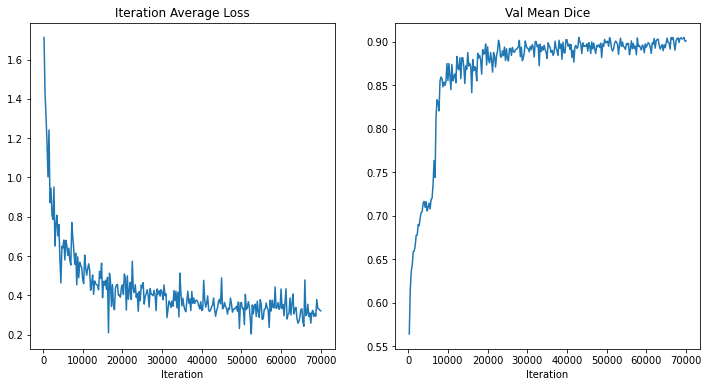

In [11]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Iteration Average Loss")
x = [eval_num * (i + 1) for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [eval_num * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.show()

### Check best model output with the input image and label

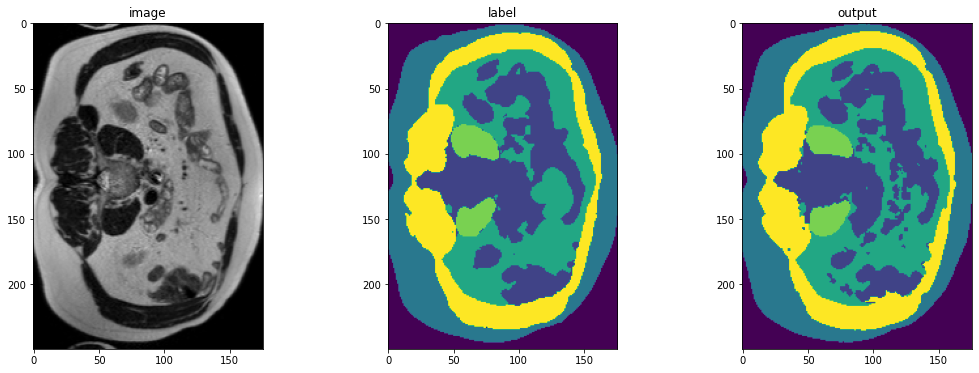

In [12]:
case_num = 0
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold2.pth")))
model.eval()
with torch.no_grad():
    img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
    img = val_ds[case_num]["image"]
    label = val_ds[case_num]["label"]
    val_inputs = torch.unsqueeze(img, 1).to(device)
    val_labels = torch.unsqueeze(label, 1).to(device)
    val_outputs = sliding_window_inference(
        val_inputs, (96, 96, 16), 4, model, overlap=0.8
    )
    plt.figure("check", (18, 6))
    plt.subplot(1, 3, 1)
    plt.title("image")
    plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, 5], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title("label")
    plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, 5])
    plt.subplot(1, 3, 3)
    plt.title("output")
    plt.imshow(
        torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 5]
    )
    plt.show()
    

### Inference on test images

In [6]:
import glob
from monai.data import Dataset
from monai.handlers.utils import from_engine
from monai.transforms import (
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandCropByPosNegLabeld,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    EnsureTyped,
    EnsureType,
    Invertd,
)

test_images = sorted(
    glob.glob(os.path.join(root_dir, "../data/imagesTs/", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]


test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(
            1.5, 1.5, 4.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250,
            b_min=0.0, b_max=1.0, clip=False,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
        EnsureTyped(keys="image"),
    ]
)

test_org_ds = Dataset(
    data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose([
    EnsureTyped(keys="pred"),
    Invertd(
        keys="pred",
        transform=test_org_transforms,
        orig_keys="image",
        meta_keys="pred_meta_dict",
        orig_meta_keys="image_meta_dict",
        meta_key_postfix="meta_dict",
        nearest_interp=False,
        to_tensor=True,
    ),
    AsDiscreted(keys="pred", argmax=True, to_onehot=6),
    SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./outMR09fold2", output_postfix="seg", resample=False, separate_folder=False),
])

Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


2024-03-28 08:18:56,058 INFO image_writer.py:194 - writing: outMR09fold2/A002_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


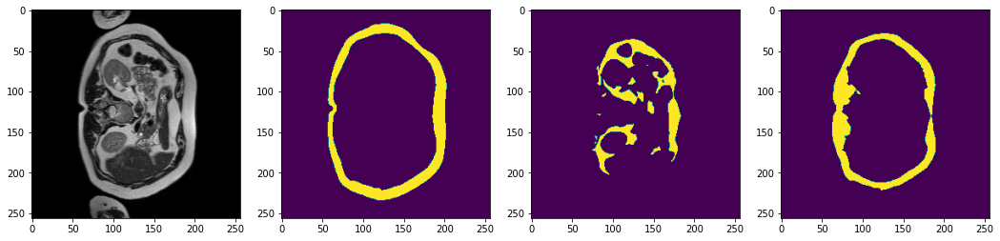

2024-03-28 08:18:58,430 INFO image_writer.py:194 - writing: outMR09fold2/A002_v2_T2W_seg.nii.gz


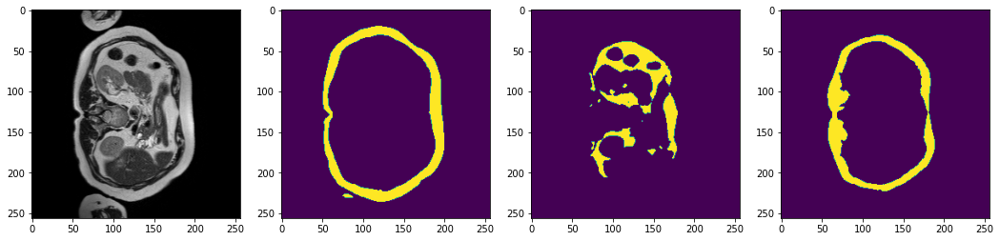

2024-03-28 08:19:00,870 INFO image_writer.py:194 - writing: outMR09fold2/A002_v3_T2W_seg.nii.gz


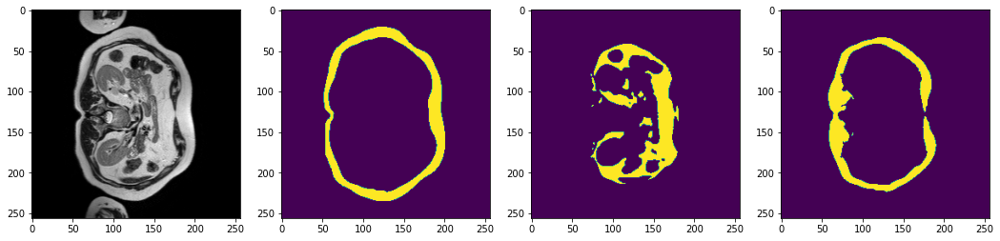

2024-03-28 08:19:03,242 INFO image_writer.py:194 - writing: outMR09fold2/A003_v1_T2W_seg.nii.gz


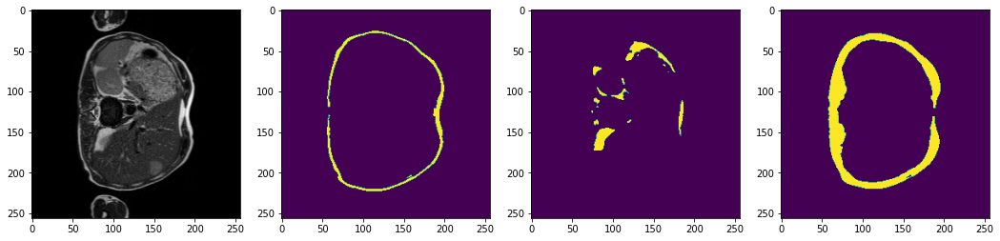

2024-03-28 08:19:05,606 INFO image_writer.py:194 - writing: outMR09fold2/A003_v2_T2W_seg.nii.gz


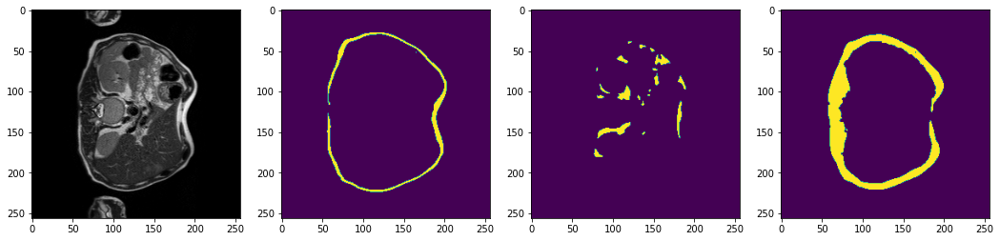

2024-03-28 08:19:07,923 INFO image_writer.py:194 - writing: outMR09fold2/A009_v1_T2W_seg.nii.gz


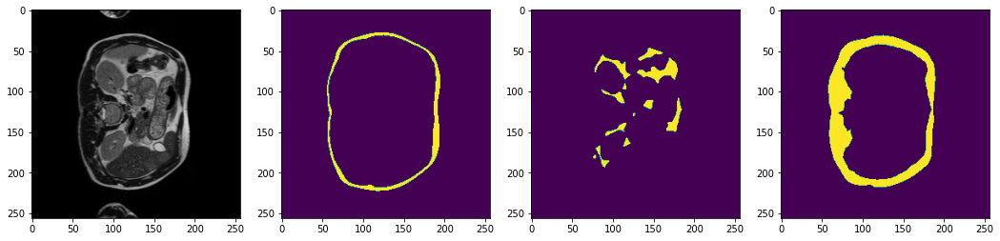

2024-03-28 08:19:10,306 INFO image_writer.py:194 - writing: outMR09fold2/A009_v2_T2W_seg.nii.gz


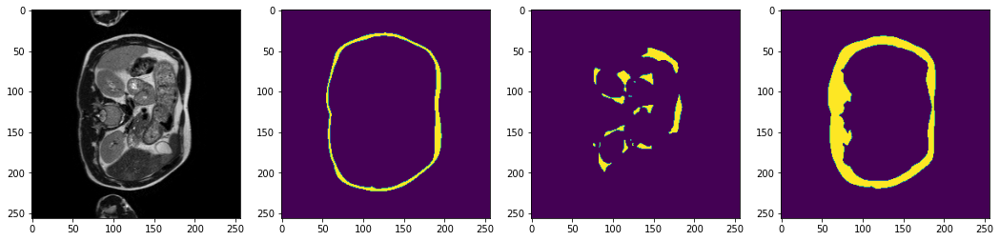

2024-03-28 08:19:12,643 INFO image_writer.py:194 - writing: outMR09fold2/A011_v1_T2W_seg.nii.gz


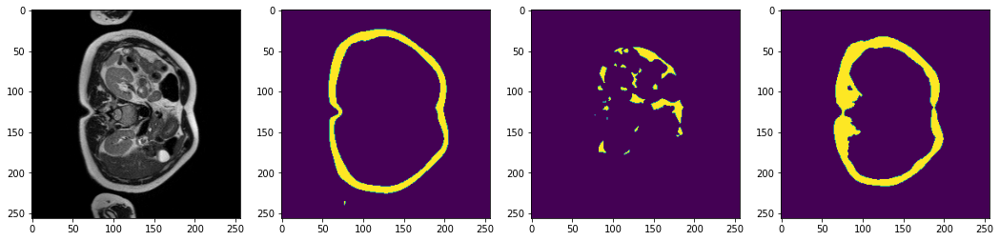

2024-03-28 08:19:15,056 INFO image_writer.py:194 - writing: outMR09fold2/A011_v2_T2W_seg.nii.gz


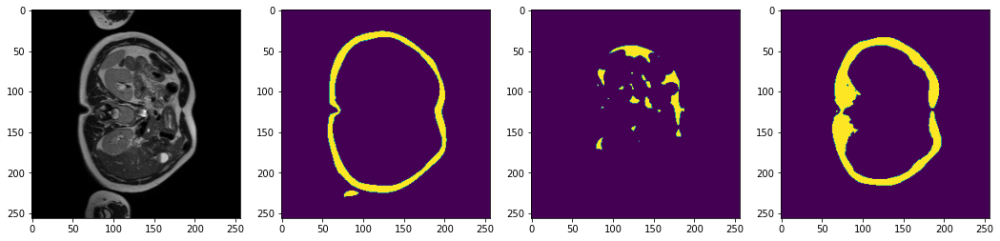

2024-03-28 08:19:17,559 INFO image_writer.py:194 - writing: outMR09fold2/A013_v1_T2W_seg.nii.gz


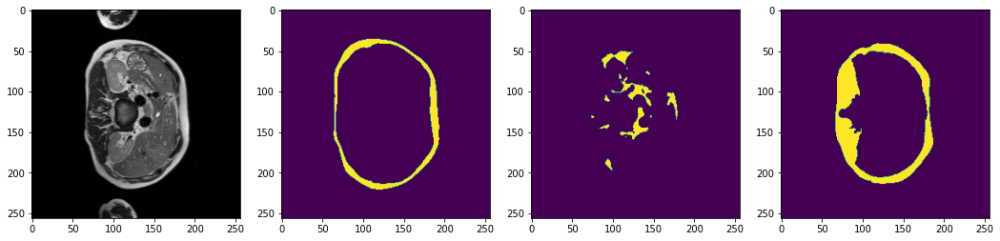

2024-03-28 08:19:19,645 INFO image_writer.py:194 - writing: outMR09fold2/A013_v2_T2W_seg.nii.gz


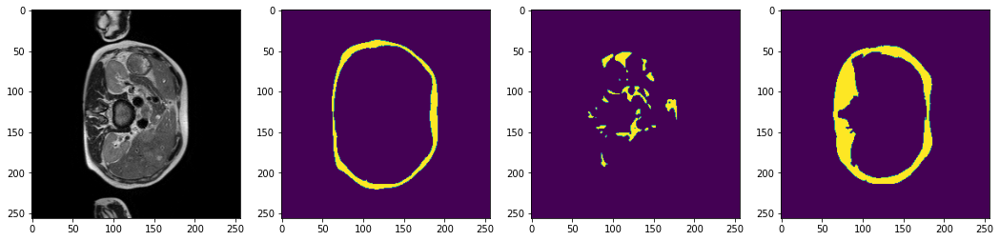

2024-03-28 08:19:21,962 INFO image_writer.py:194 - writing: outMR09fold2/A014_v1_T2W_seg.nii.gz


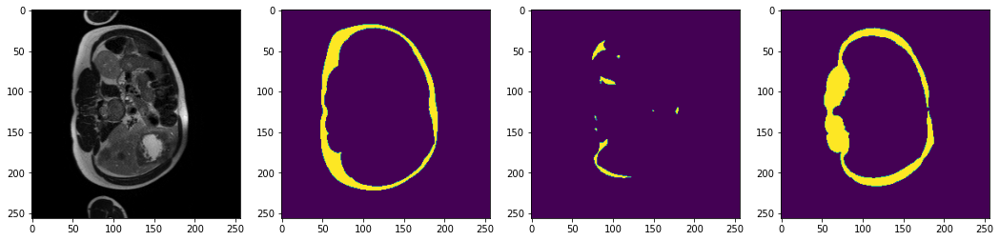

2024-03-28 08:19:24,261 INFO image_writer.py:194 - writing: outMR09fold2/A014_v2_T2W_seg.nii.gz


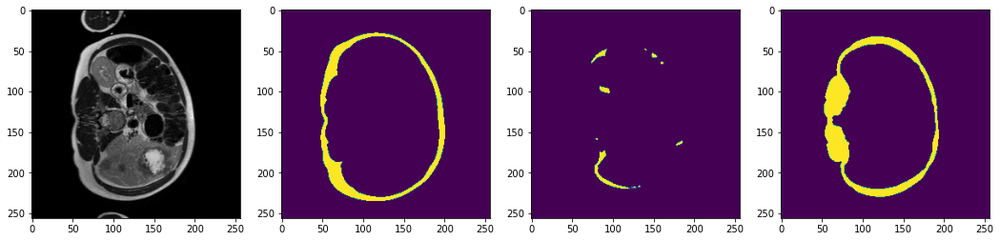

2024-03-28 08:19:26,607 INFO image_writer.py:194 - writing: outMR09fold2/A015_v1_T2W_seg.nii.gz


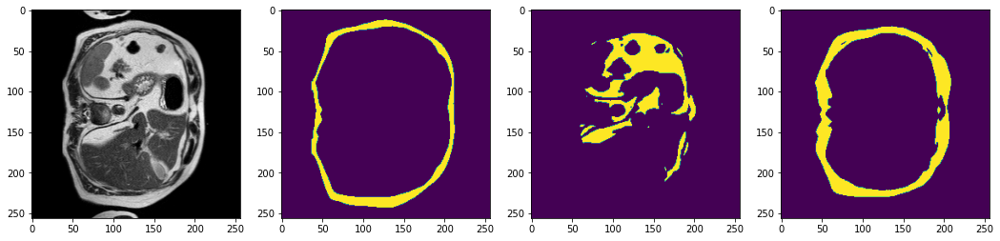

2024-03-28 08:19:28,960 INFO image_writer.py:194 - writing: outMR09fold2/A015_v2_T2W_seg.nii.gz


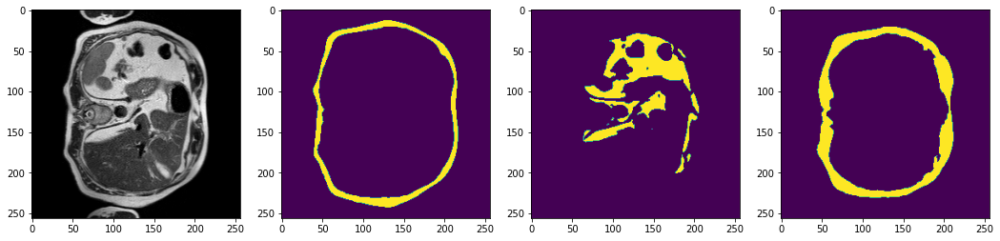

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 08:19:31,300 INFO image_writer.py:194 - writing: outMR09fold2/A016_v1_T2W_seg.nii.gz


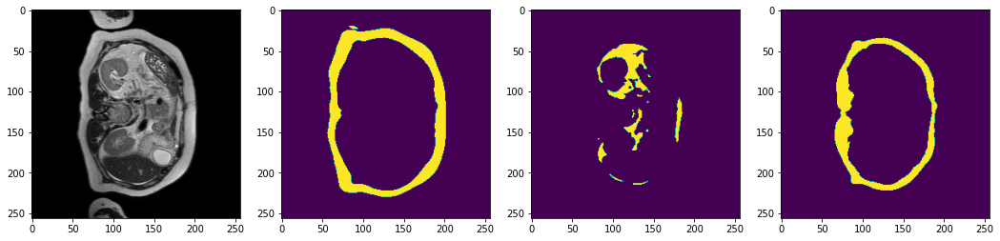

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 08:19:33,825 INFO image_writer.py:194 - writing: outMR09fold2/A016_v2_T2W_seg.nii.gz


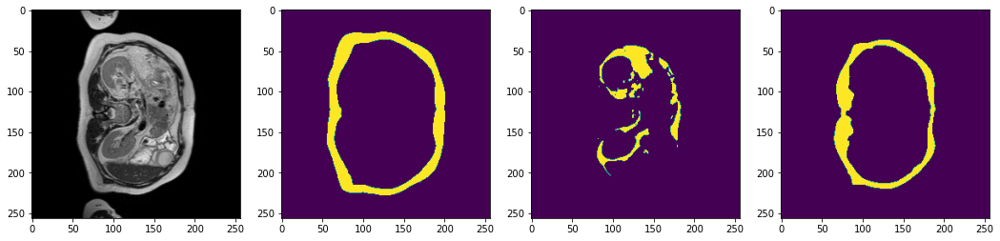

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 08:19:36,191 INFO image_writer.py:194 - writing: outMR09fold2/A017_v1_T2W_seg.nii.gz


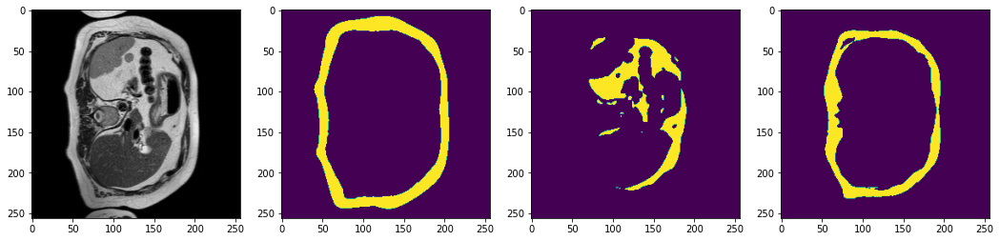

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 08:19:38,564 INFO image_writer.py:194 - writing: outMR09fold2/A017_v2_T2W_seg.nii.gz


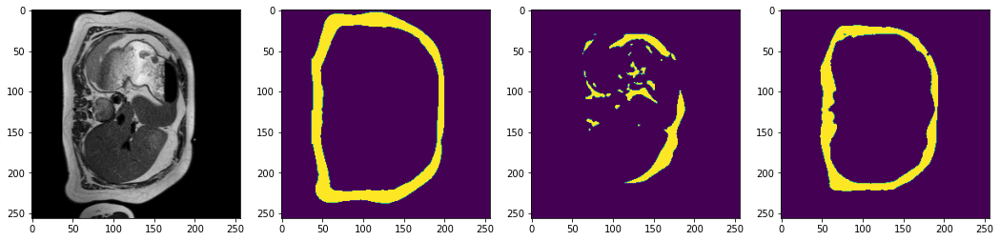

2024-03-28 08:19:40,917 INFO image_writer.py:194 - writing: outMR09fold2/A018_v1_T2W_seg.nii.gz


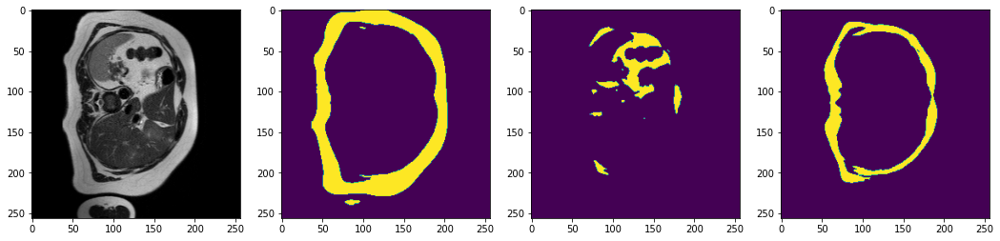

2024-03-28 08:19:43,261 INFO image_writer.py:194 - writing: outMR09fold2/A018_v2_T2W_seg.nii.gz


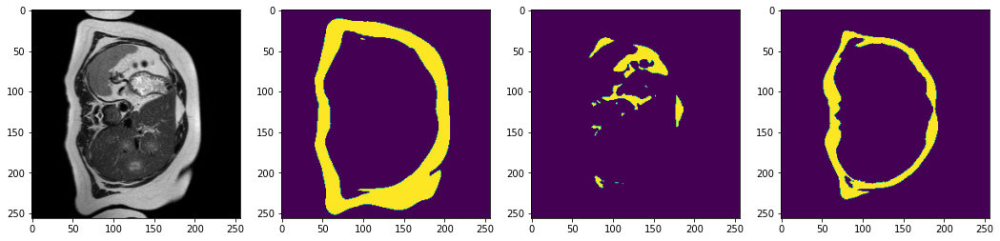

2024-03-28 08:19:45,614 INFO image_writer.py:194 - writing: outMR09fold2/A021_v1_T2W_seg.nii.gz


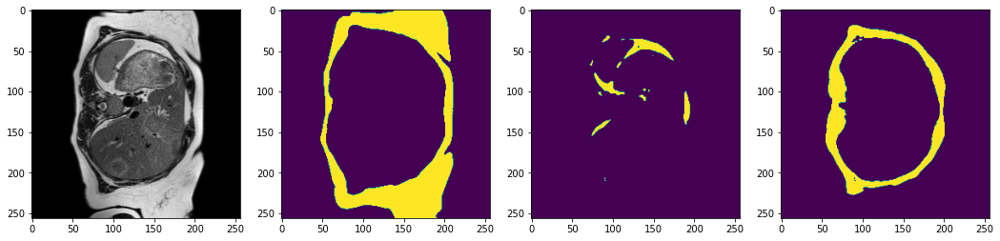

2024-03-28 08:19:47,981 INFO image_writer.py:194 - writing: outMR09fold2/A021_v2_T2W_seg.nii.gz


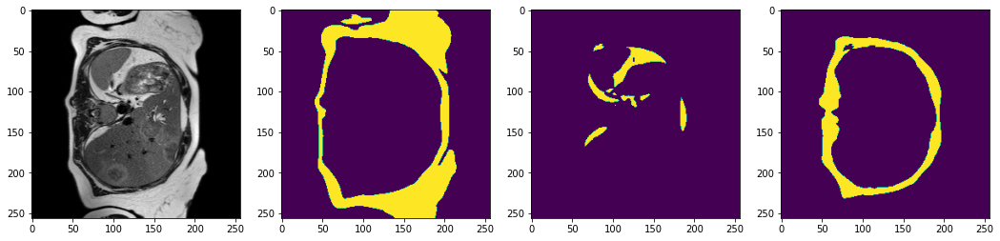

2024-03-28 08:19:53,865 INFO image_writer.py:194 - writing: outMR09fold2/A022_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


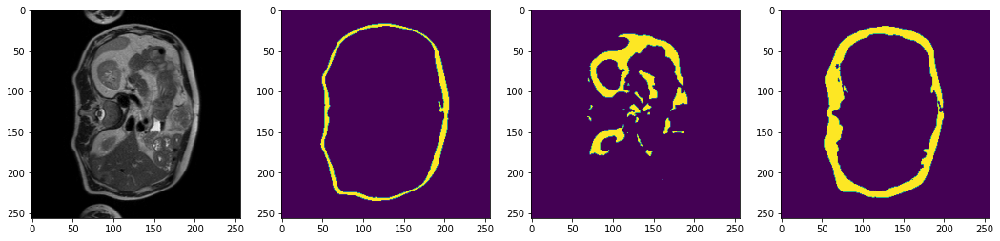

2024-03-28 08:19:59,632 INFO image_writer.py:194 - writing: outMR09fold2/A022_v2_T2W_seg.nii.gz


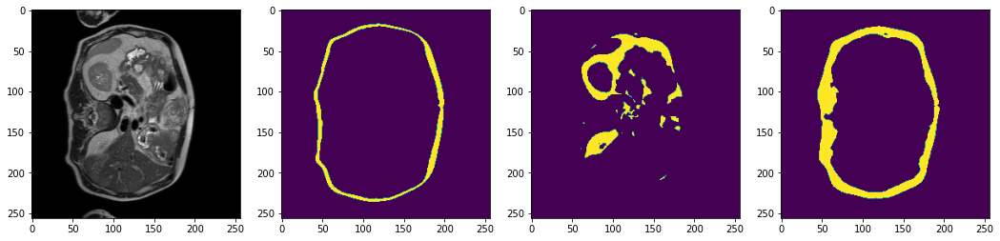

2024-03-28 08:20:05,387 INFO image_writer.py:194 - writing: outMR09fold2/A023_v1_T2W_seg.nii.gz


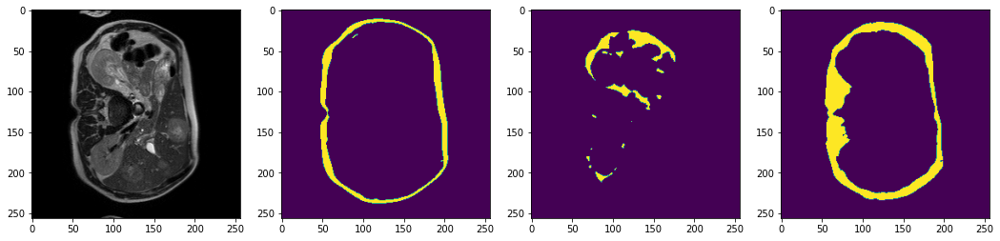

2024-03-28 08:20:11,106 INFO image_writer.py:194 - writing: outMR09fold2/A023_v2_T2W_seg.nii.gz


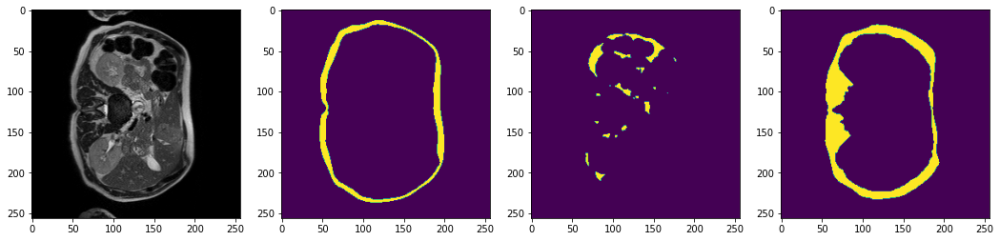

2024-03-28 08:20:13,481 INFO image_writer.py:194 - writing: outMR09fold2/A024_v1_T2W_seg.nii.gz


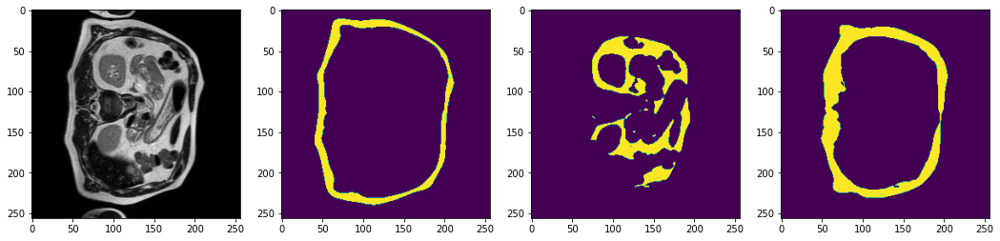

2024-03-28 08:20:15,855 INFO image_writer.py:194 - writing: outMR09fold2/A024_v2_T2W_seg.nii.gz


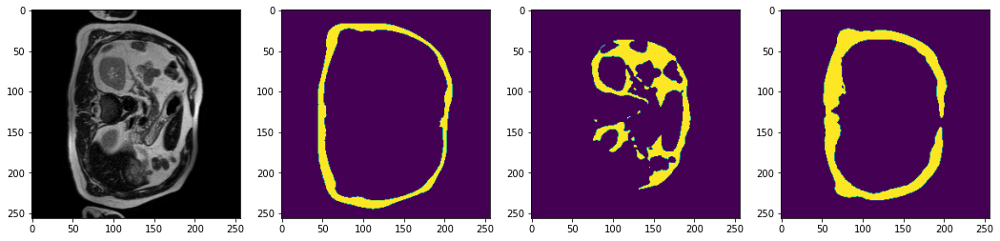

2024-03-28 08:20:21,594 INFO image_writer.py:194 - writing: outMR09fold2/A026_v1_T2W_seg.nii.gz


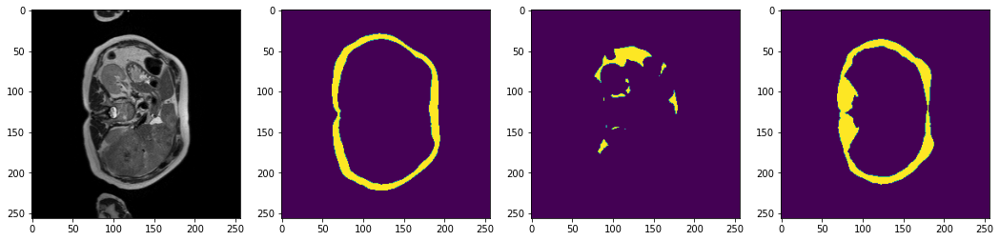

2024-03-28 08:20:27,492 INFO image_writer.py:194 - writing: outMR09fold2/A026_v2_T2W_seg.nii.gz


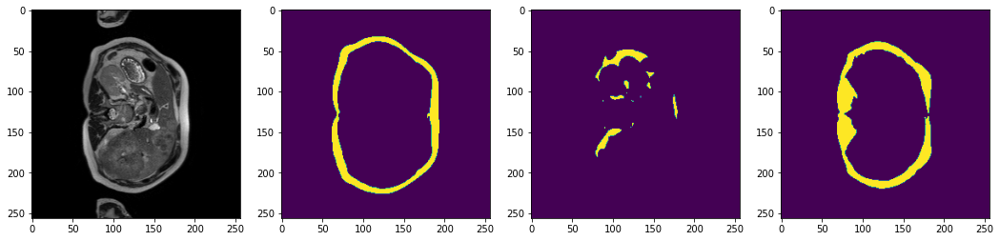

2024-03-28 08:20:29,913 INFO image_writer.py:194 - writing: outMR09fold2/A028_v1_T2W_seg.nii.gz


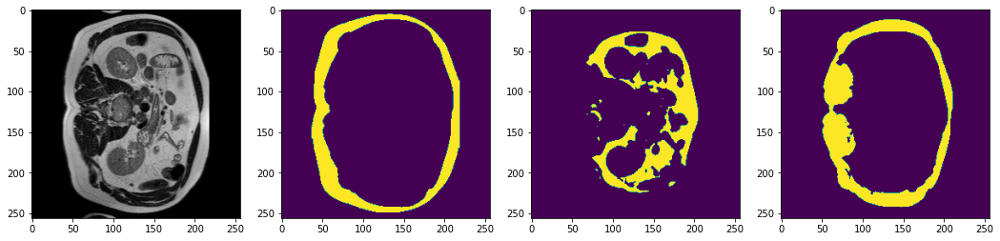

2024-03-28 08:20:32,330 INFO image_writer.py:194 - writing: outMR09fold2/A028_v2_T2W_seg.nii.gz


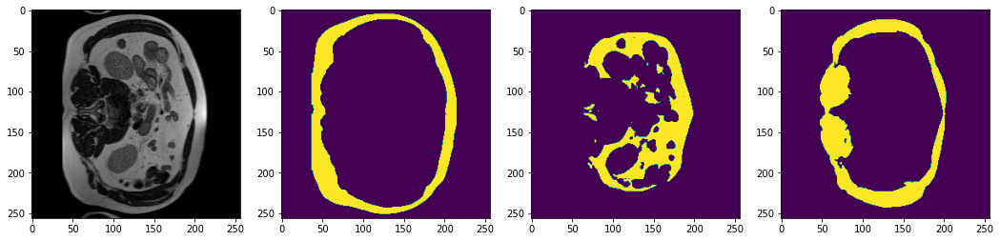

2024-03-28 08:20:34,739 INFO image_writer.py:194 - writing: outMR09fold2/A029_v1_T2W_seg.nii.gz


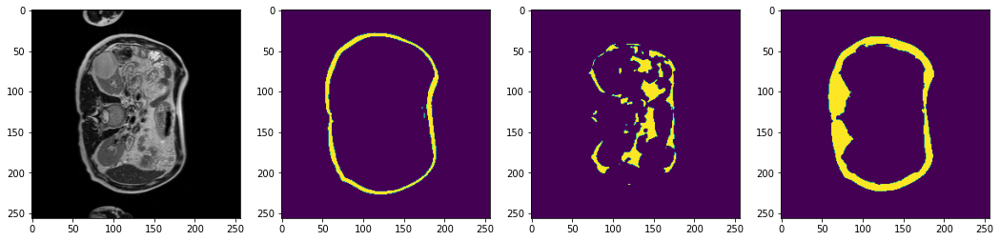

2024-03-28 08:20:36,947 INFO image_writer.py:194 - writing: outMR09fold2/A029_v2_T2W_seg.nii.gz


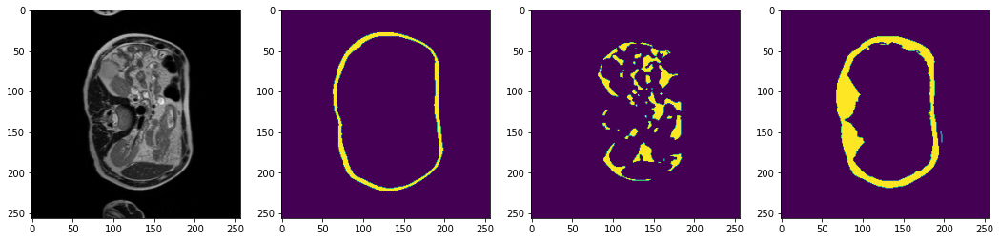

2024-03-28 08:20:39,349 INFO image_writer.py:194 - writing: outMR09fold2/A029_v3_T2W_seg.nii.gz


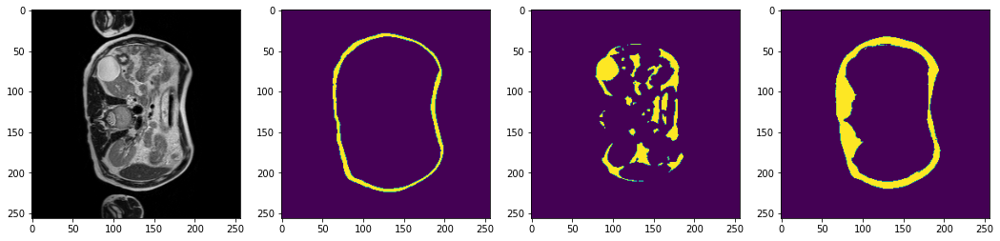

2024-03-28 08:20:41,512 INFO image_writer.py:194 - writing: outMR09fold2/A029_v4_T2W_seg.nii.gz


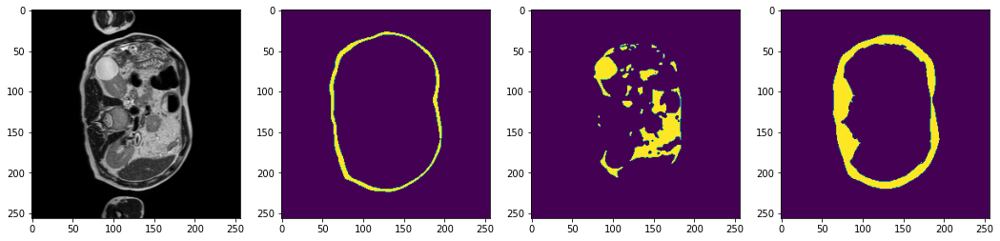

2024-03-28 08:20:43,897 INFO image_writer.py:194 - writing: outMR09fold2/A030_v1_T2W_seg.nii.gz


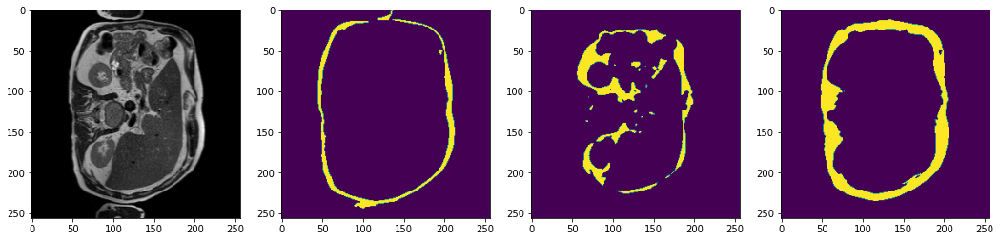

2024-03-28 08:20:46,491 INFO image_writer.py:194 - writing: outMR09fold2/A030_v2_T2W_seg.nii.gz


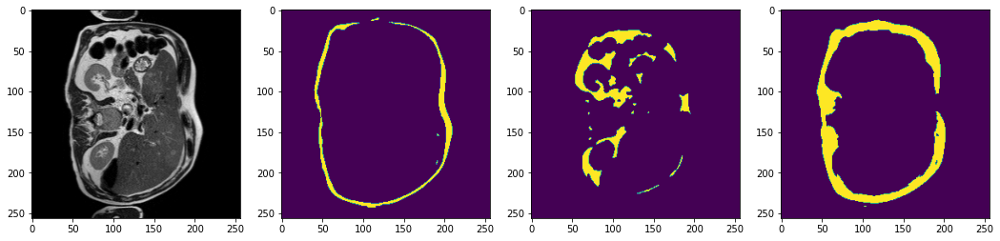

2024-03-28 08:20:48,612 INFO image_writer.py:194 - writing: outMR09fold2/A031_v1_T2W_seg.nii.gz


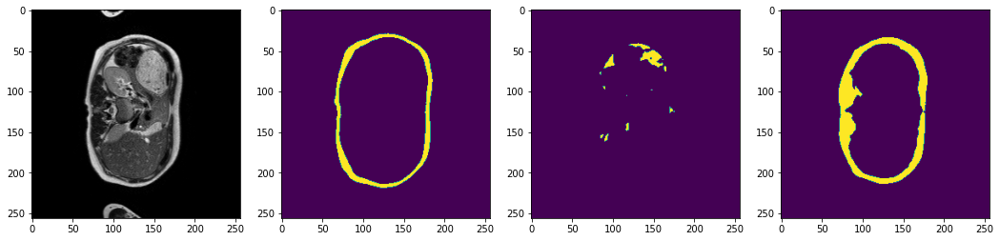

2024-03-28 08:20:50,731 INFO image_writer.py:194 - writing: outMR09fold2/A031_v2_T2W_seg.nii.gz


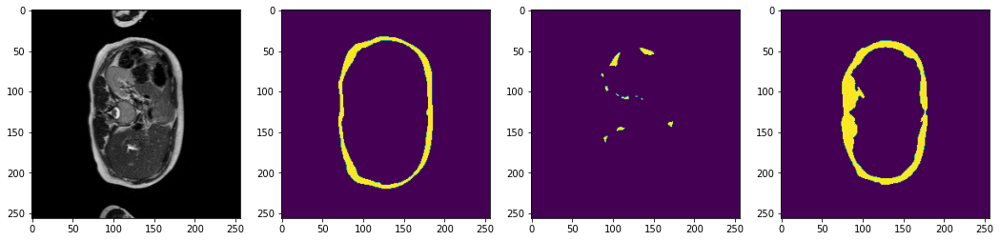

2024-03-28 08:20:56,587 INFO image_writer.py:194 - writing: outMR09fold2/A032_v1_T2W_seg.nii.gz


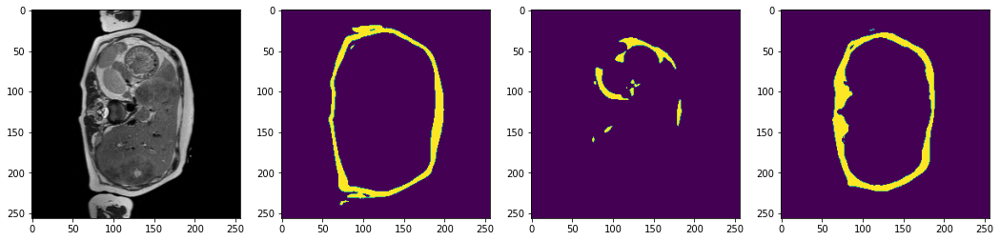

2024-03-28 08:21:02,434 INFO image_writer.py:194 - writing: outMR09fold2/A032_v2_T2W_seg.nii.gz


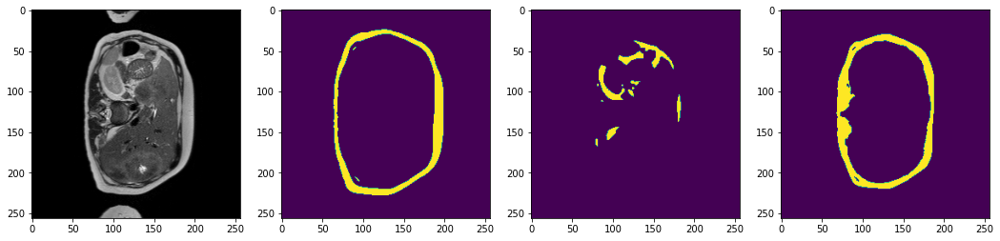

2024-03-28 08:21:08,234 INFO image_writer.py:194 - writing: outMR09fold2/A033_v1_T2W_seg.nii.gz


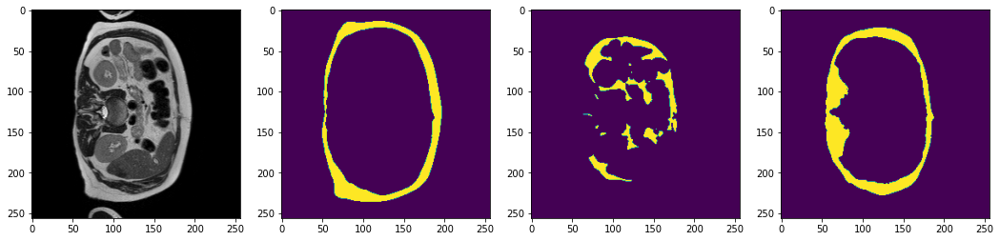

2024-03-28 08:21:14,030 INFO image_writer.py:194 - writing: outMR09fold2/A033_v2_T2W_seg.nii.gz


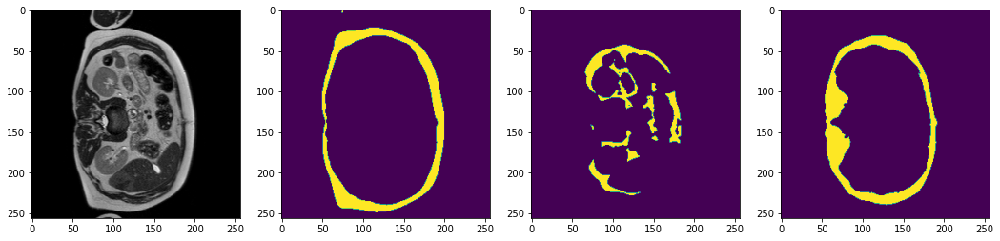

2024-03-28 08:21:19,962 INFO image_writer.py:194 - writing: outMR09fold2/A033_v3_T2W_seg.nii.gz


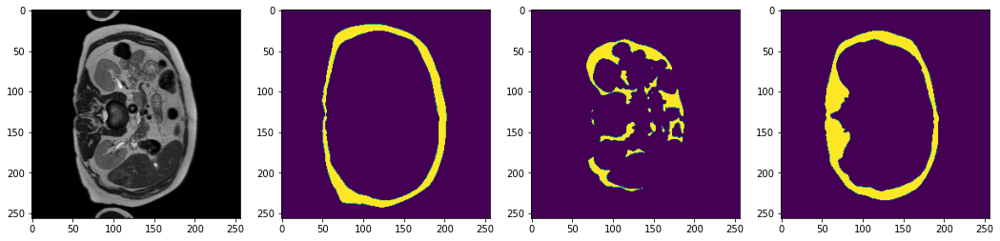

2024-03-28 08:21:25,785 INFO image_writer.py:194 - writing: outMR09fold2/A033_v4_T2W_seg.nii.gz


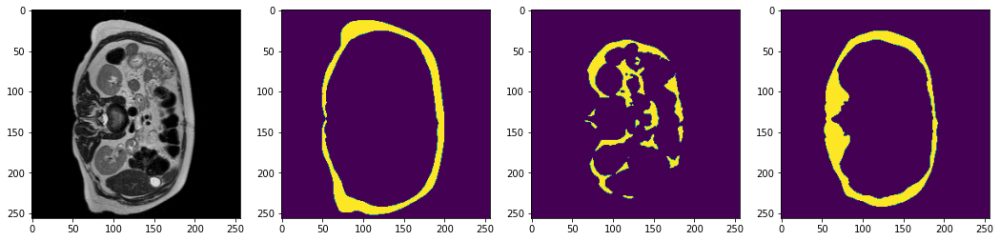

2024-03-28 08:21:31,574 INFO image_writer.py:194 - writing: outMR09fold2/A034_v1_T2W_seg.nii.gz


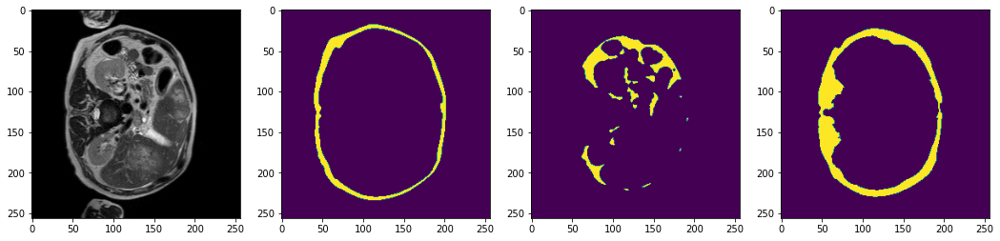

2024-03-28 08:21:37,429 INFO image_writer.py:194 - writing: outMR09fold2/A034_v2_T2W_seg.nii.gz


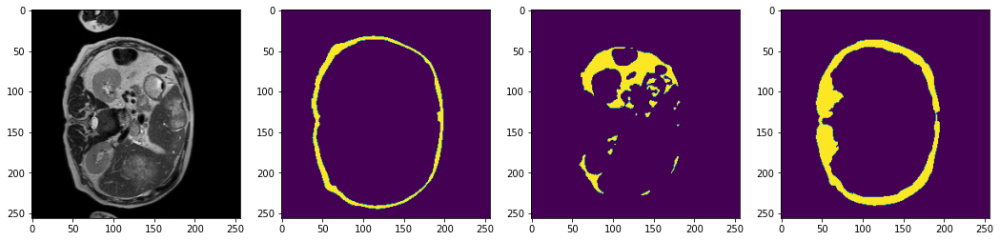

2024-03-28 08:21:43,235 INFO image_writer.py:194 - writing: outMR09fold2/A036_v1_T2W_seg.nii.gz


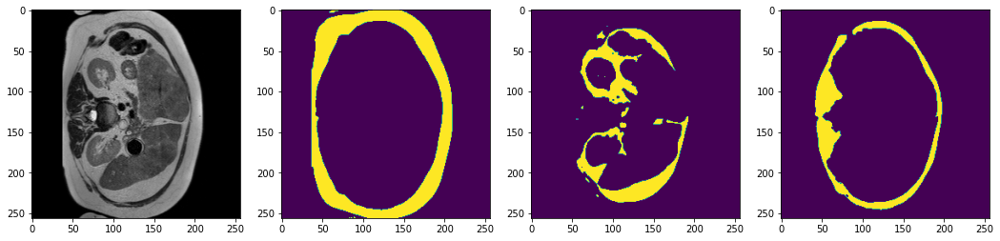

2024-03-28 08:21:49,071 INFO image_writer.py:194 - writing: outMR09fold2/A036_v2_T2W_seg.nii.gz


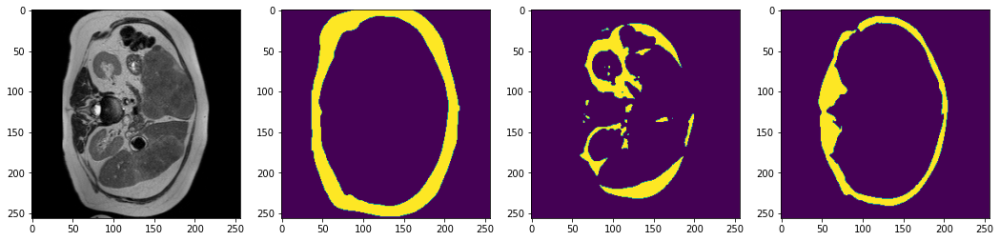

2024-03-28 08:21:54,065 INFO image_writer.py:194 - writing: outMR09fold2/A037_v1_T2W_seg.nii.gz


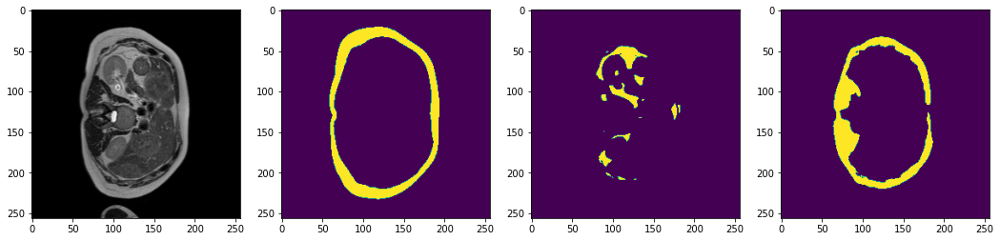

2024-03-28 08:22:00,061 INFO image_writer.py:194 - writing: outMR09fold2/A037_v2_T2W_seg.nii.gz


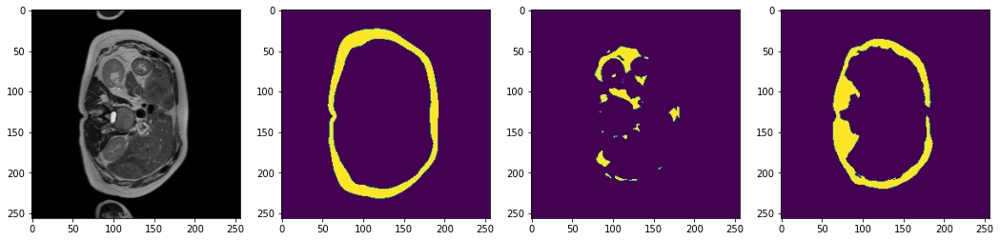

2024-03-28 08:22:02,462 INFO image_writer.py:194 - writing: outMR09fold2/A038_v1_T2W_seg.nii.gz


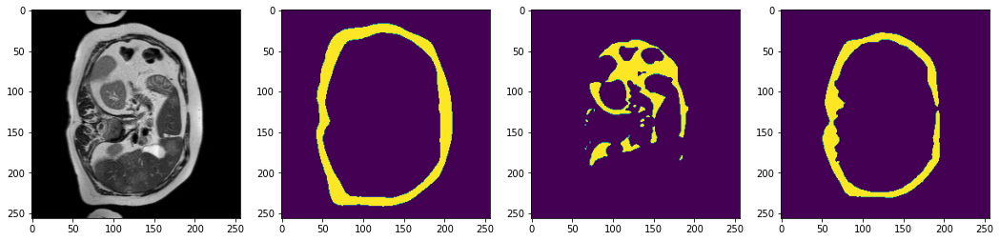

2024-03-28 08:22:04,878 INFO image_writer.py:194 - writing: outMR09fold2/A038_v2_T2W_seg.nii.gz


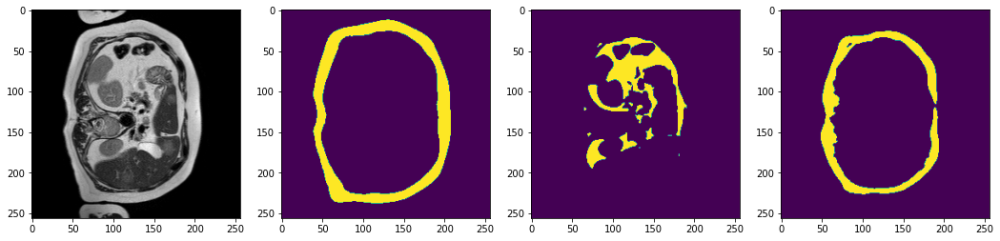

2024-03-28 08:22:07,056 INFO image_writer.py:194 - writing: outMR09fold2/A039_v1_T2W_seg.nii.gz


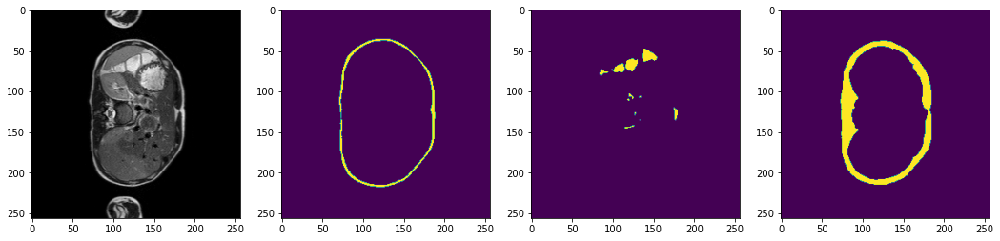

2024-03-28 08:22:08,920 INFO image_writer.py:194 - writing: outMR09fold2/A039_v2_T2W_seg.nii.gz


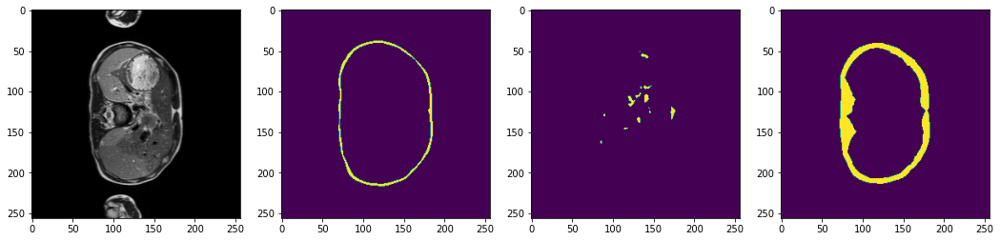

2024-03-28 08:22:14,766 INFO image_writer.py:194 - writing: outMR09fold2/A040_v1_T2W_seg.nii.gz


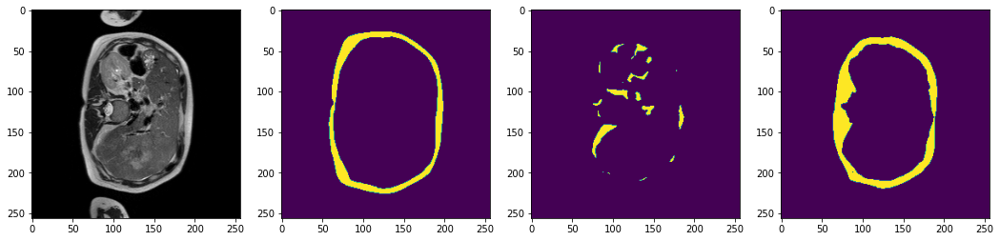

2024-03-28 08:22:20,570 INFO image_writer.py:194 - writing: outMR09fold2/A040_v2_T2W_seg.nii.gz


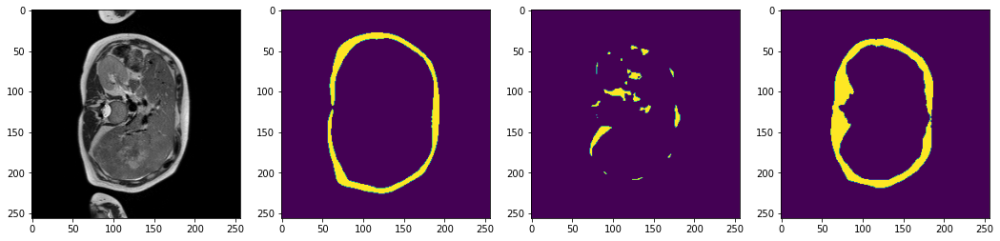

2024-03-28 08:22:23,129 INFO image_writer.py:194 - writing: outMR09fold2/A041_v1_T2W_seg.nii.gz


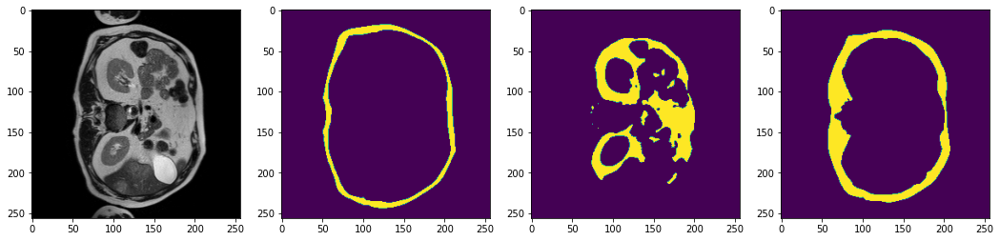

2024-03-28 08:22:25,558 INFO image_writer.py:194 - writing: outMR09fold2/A041_v2_T2W_seg.nii.gz


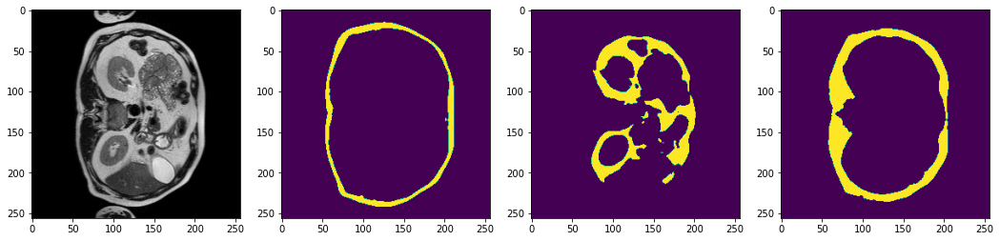

2024-03-28 08:22:31,355 INFO image_writer.py:194 - writing: outMR09fold2/A043_v1_T2W_seg.nii.gz


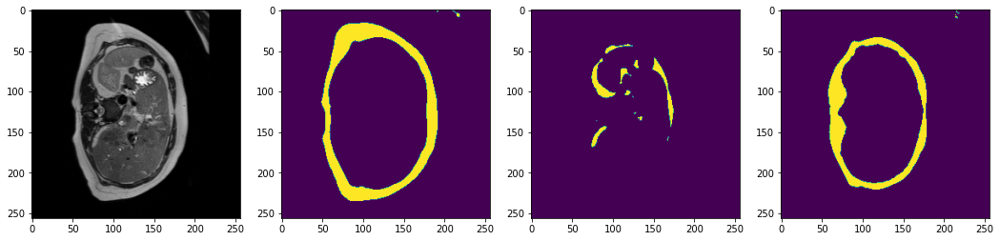

2024-03-28 08:22:37,173 INFO image_writer.py:194 - writing: outMR09fold2/A043_v2_T2W_seg.nii.gz


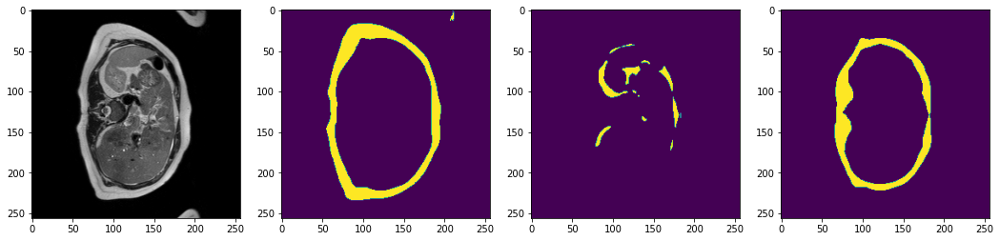

2024-03-28 08:22:42,960 INFO image_writer.py:194 - writing: outMR09fold2/A043_v5_T2W_seg.nii.gz


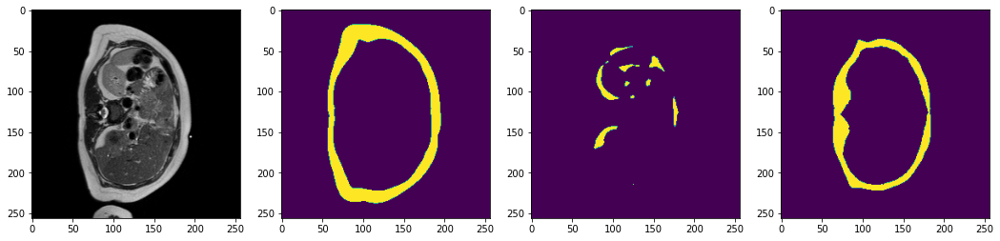

2024-03-28 08:22:45,400 INFO image_writer.py:194 - writing: outMR09fold2/A046_v1_T2W_seg.nii.gz


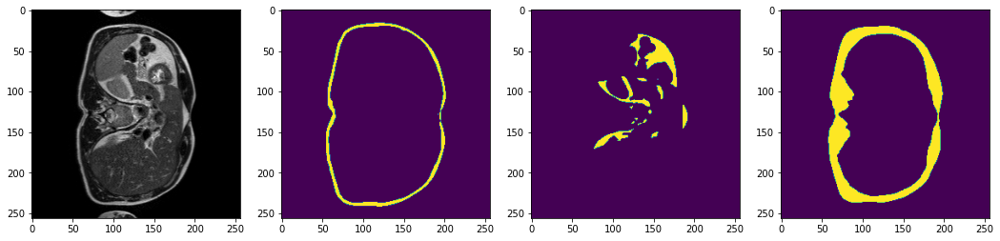

2024-03-28 08:22:47,820 INFO image_writer.py:194 - writing: outMR09fold2/A046_v2_T2W_seg.nii.gz


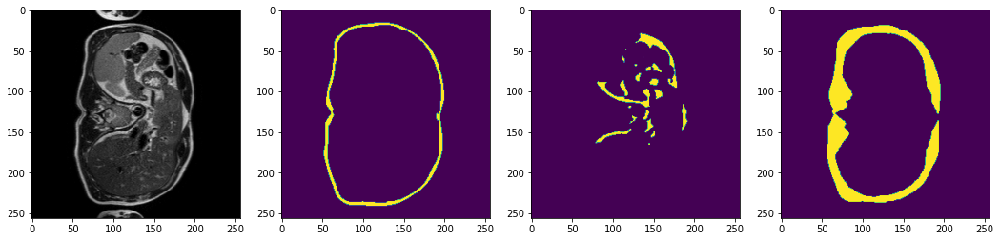

2024-03-28 08:22:50,236 INFO image_writer.py:194 - writing: outMR09fold2/A047_v1_T2W_seg.nii.gz


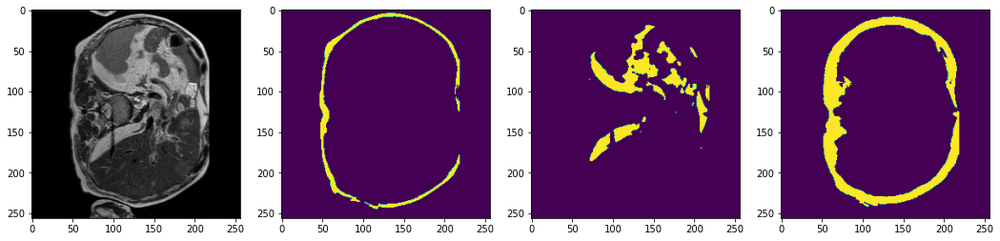

2024-03-28 08:22:52,823 INFO image_writer.py:194 - writing: outMR09fold2/A047_v2_T2W_seg.nii.gz


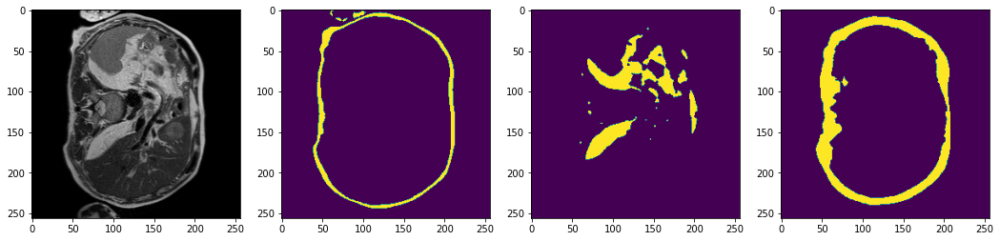

2024-03-28 08:22:55,264 INFO image_writer.py:194 - writing: outMR09fold2/A048_v1_T2W_seg.nii.gz


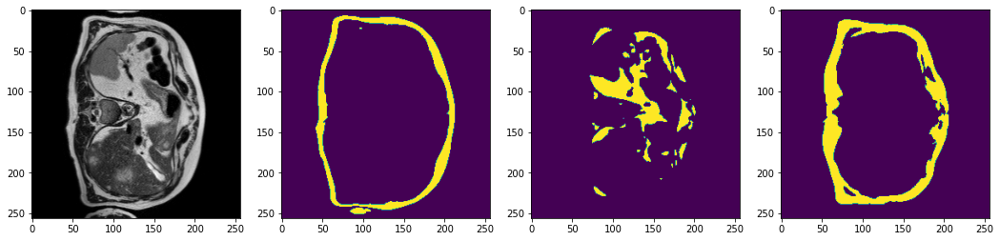

2024-03-28 08:22:57,664 INFO image_writer.py:194 - writing: outMR09fold2/A048_v2_T2W_seg.nii.gz


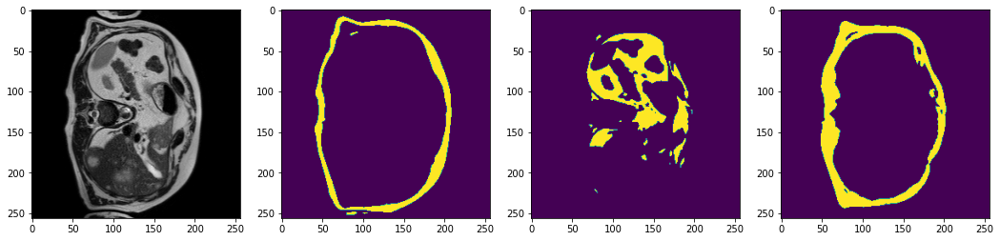

2024-03-28 08:23:00,112 INFO image_writer.py:194 - writing: outMR09fold2/A049_v1_T2W_seg.nii.gz


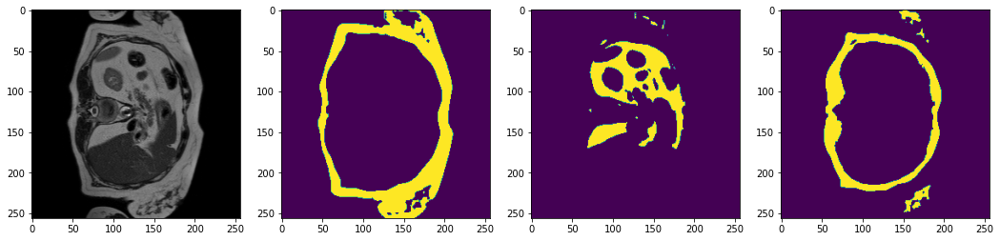

2024-03-28 08:23:02,548 INFO image_writer.py:194 - writing: outMR09fold2/A049_v2_T2W_seg.nii.gz


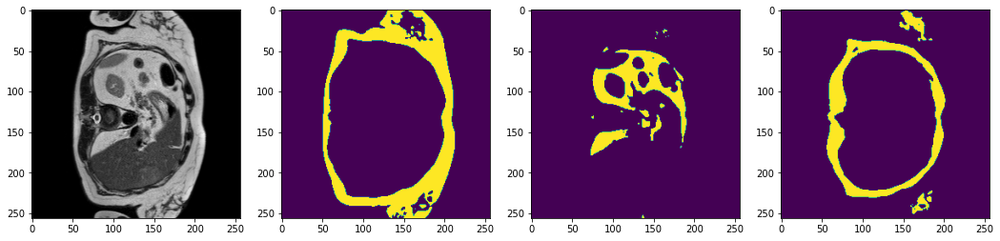

2024-03-28 08:23:04,967 INFO image_writer.py:194 - writing: outMR09fold2/A050_v1_T2W_seg.nii.gz


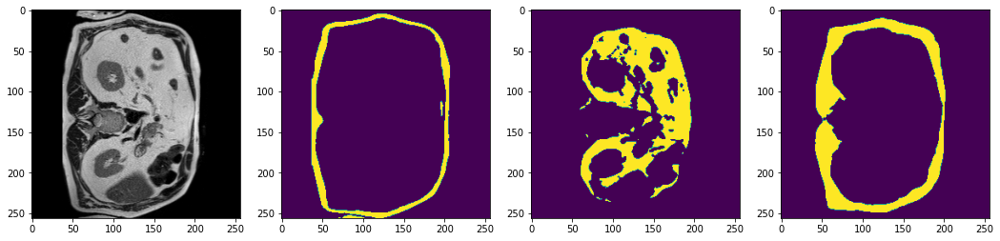

2024-03-28 08:23:07,374 INFO image_writer.py:194 - writing: outMR09fold2/A050_v2_T2W_seg.nii.gz


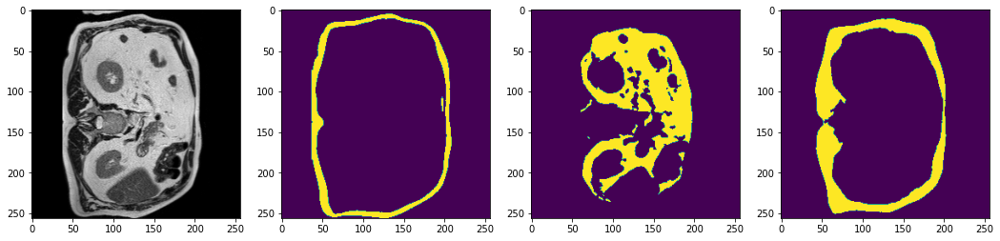

2024-03-28 08:23:09,960 INFO image_writer.py:194 - writing: outMR09fold2/A051_v1_T2W_seg.nii.gz


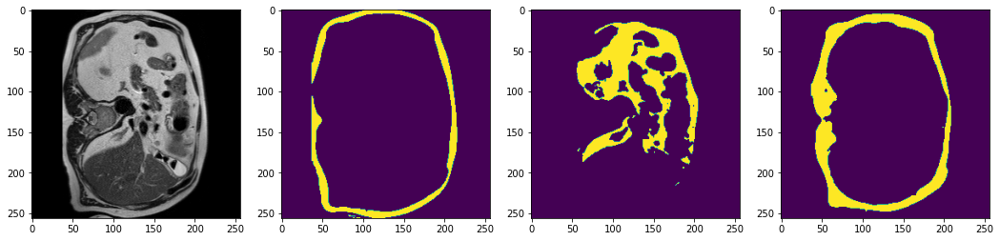

2024-03-28 08:23:12,355 INFO image_writer.py:194 - writing: outMR09fold2/A051_v2_T2W_seg.nii.gz


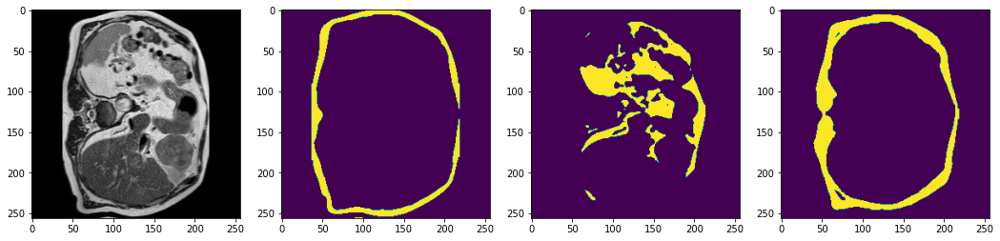

2024-03-28 08:23:18,172 INFO image_writer.py:194 - writing: outMR09fold2/A052_v1_T2W_seg.nii.gz


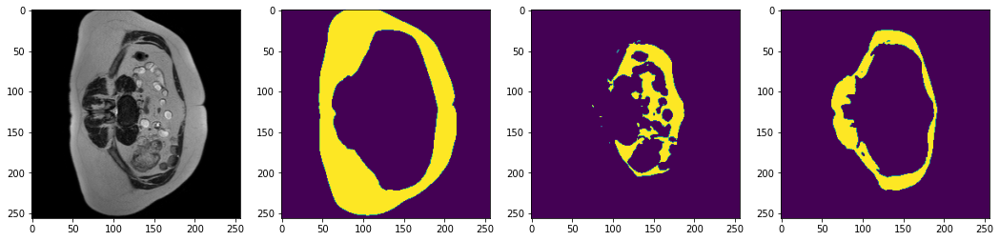

2024-03-28 08:23:23,940 INFO image_writer.py:194 - writing: outMR09fold2/A052_v2_T2W_seg.nii.gz


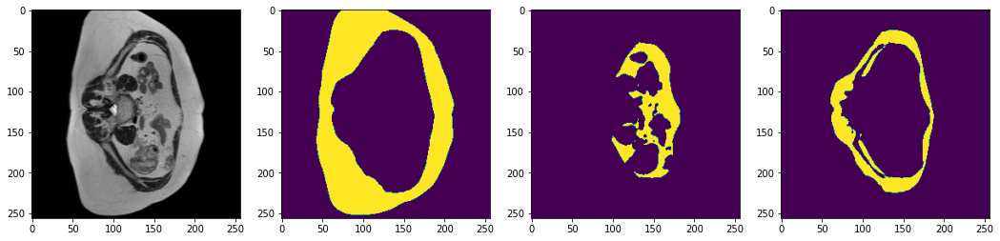

2024-03-28 08:23:26,350 INFO image_writer.py:194 - writing: outMR09fold2/A055_v1_T2W_seg.nii.gz


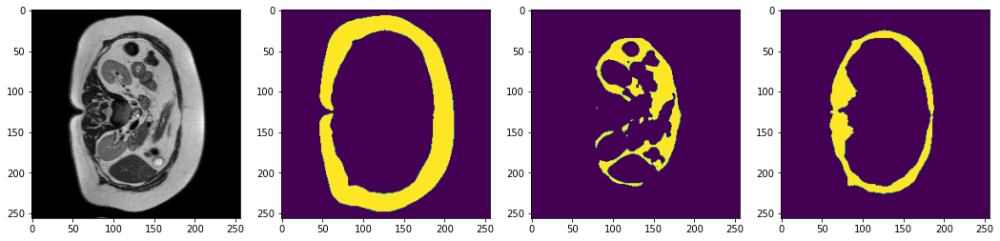

2024-03-28 08:23:28,742 INFO image_writer.py:194 - writing: outMR09fold2/A055_v2_T2W_seg.nii.gz


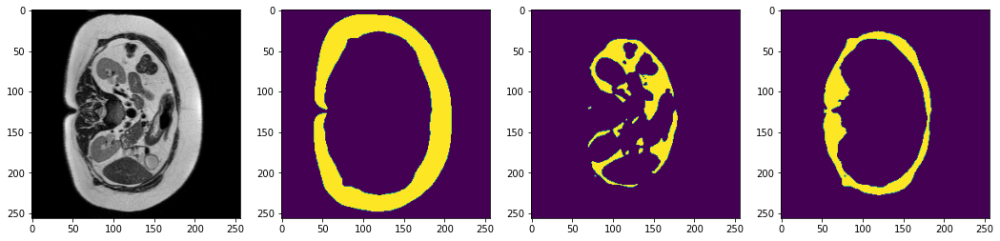

2024-03-28 08:23:31,159 INFO image_writer.py:194 - writing: outMR09fold2/A056_v1_T2W_seg.nii.gz


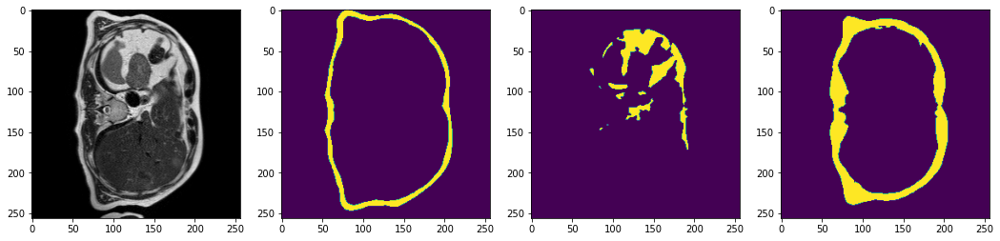

2024-03-28 08:23:33,723 INFO image_writer.py:194 - writing: outMR09fold2/A056_v2_T2W_seg.nii.gz


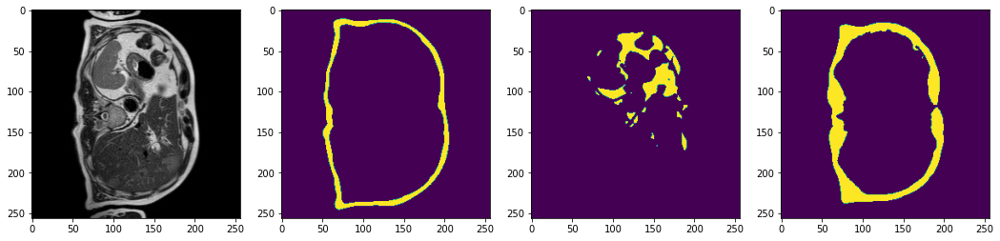

2024-03-28 08:23:36,152 INFO image_writer.py:194 - writing: outMR09fold2/A057_v1_T2W_seg.nii.gz


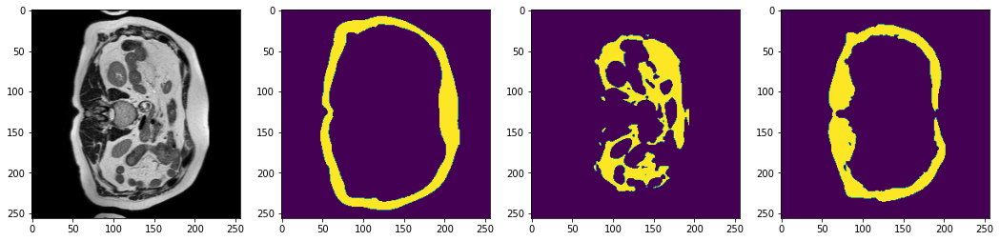

2024-03-28 08:23:38,581 INFO image_writer.py:194 - writing: outMR09fold2/A057_v2_T2W_seg.nii.gz


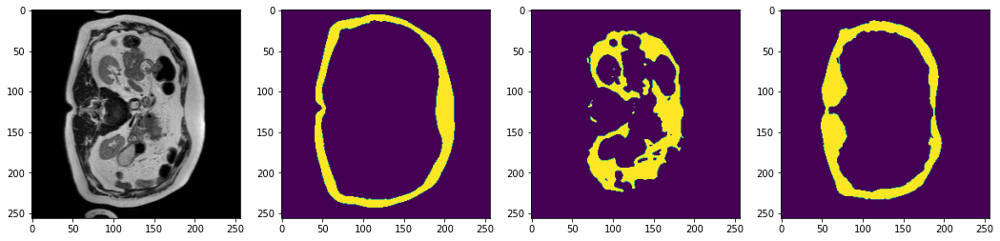

2024-03-28 08:23:44,382 INFO image_writer.py:194 - writing: outMR09fold2/A061_v1_T2W_seg.nii.gz


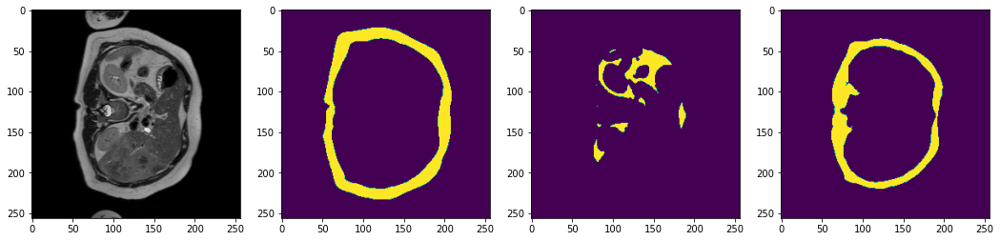

2024-03-28 08:23:50,185 INFO image_writer.py:194 - writing: outMR09fold2/A061_v2_T2W_seg.nii.gz


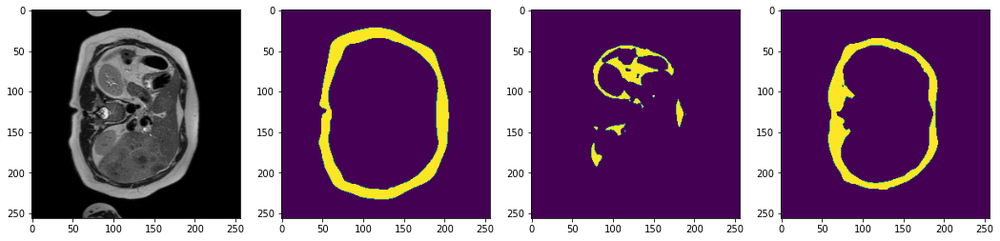

2024-03-28 08:23:52,297 INFO image_writer.py:194 - writing: outMR09fold2/A062_v1_T2W_seg.nii.gz


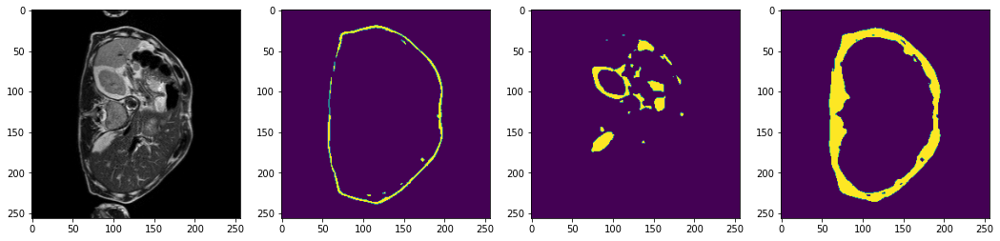

2024-03-28 08:23:54,421 INFO image_writer.py:194 - writing: outMR09fold2/A062_v2_T2W_seg.nii.gz


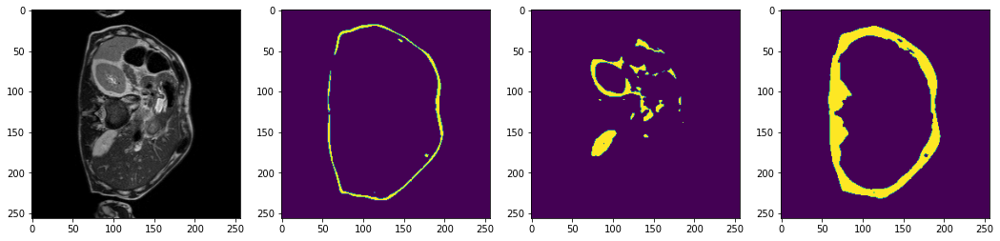

2024-03-28 08:23:57,037 INFO image_writer.py:194 - writing: outMR09fold2/A063_v1_T2W_seg.nii.gz


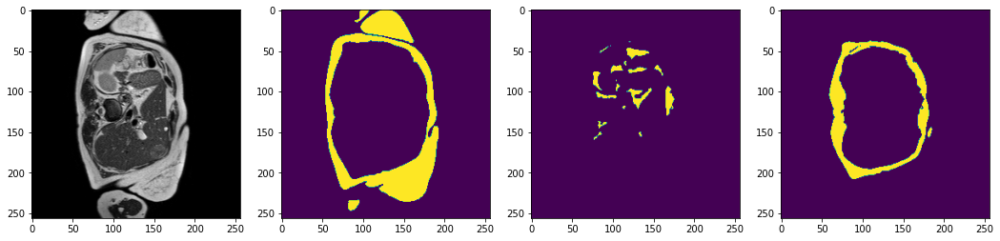

2024-03-28 08:23:59,426 INFO image_writer.py:194 - writing: outMR09fold2/A063_v2_T2W_seg.nii.gz


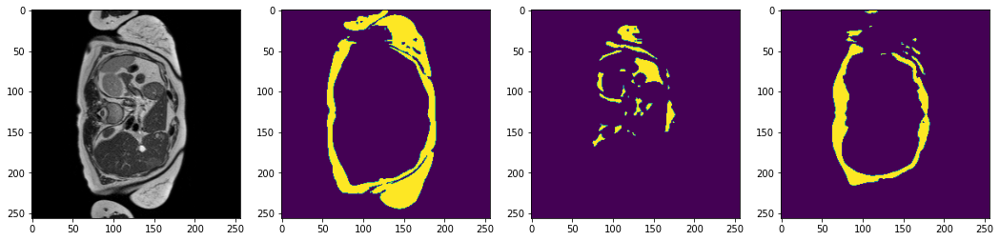

2024-03-28 08:24:01,830 INFO image_writer.py:194 - writing: outMR09fold2/A064_v1_T2W_seg.nii.gz


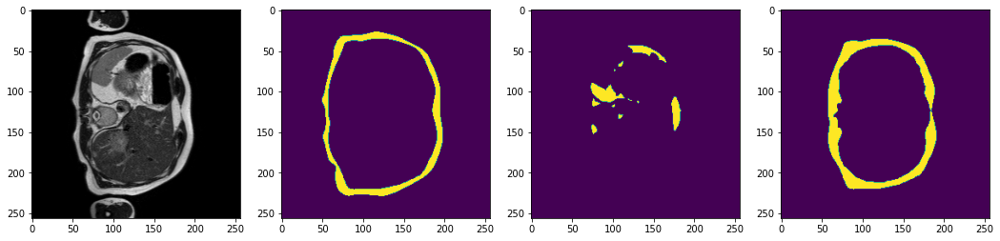

2024-03-28 08:24:04,234 INFO image_writer.py:194 - writing: outMR09fold2/A064_v2_T2W_seg.nii.gz


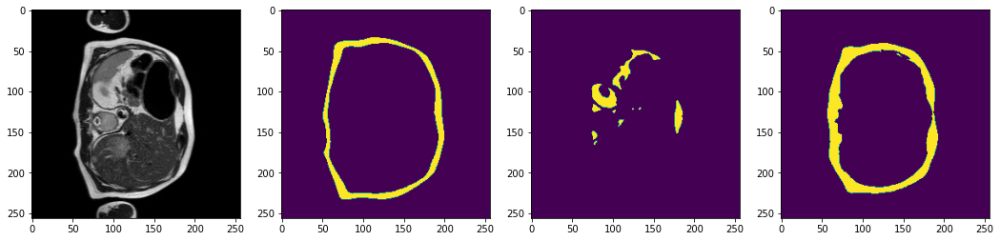

2024-03-28 08:24:06,649 INFO image_writer.py:194 - writing: outMR09fold2/A066_v1_T2W_seg.nii.gz


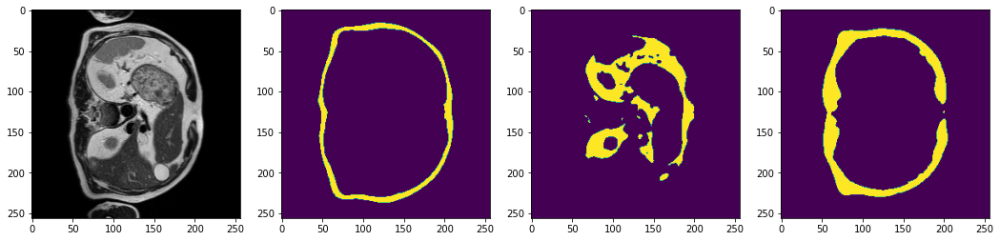

2024-03-28 08:24:09,154 INFO image_writer.py:194 - writing: outMR09fold2/A066_v2_T2W_seg.nii.gz


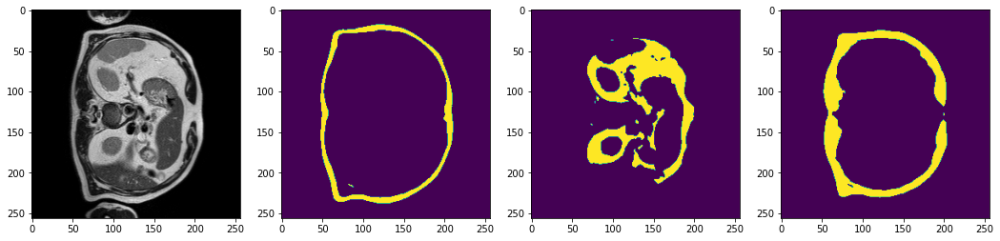

2024-03-28 08:24:11,533 INFO image_writer.py:194 - writing: outMR09fold2/A067_v1_T2W_seg.nii.gz


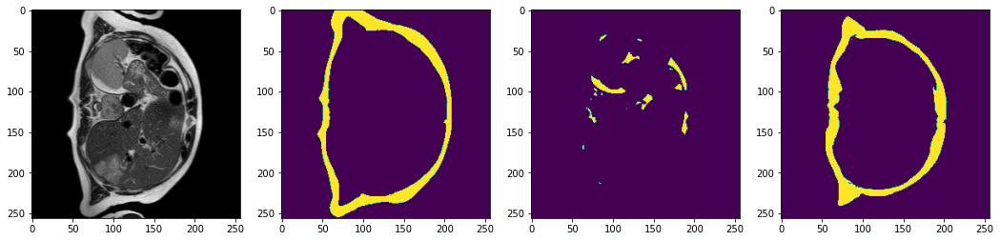

2024-03-28 08:24:14,060 INFO image_writer.py:194 - writing: outMR09fold2/A067_v2_T2W_seg.nii.gz


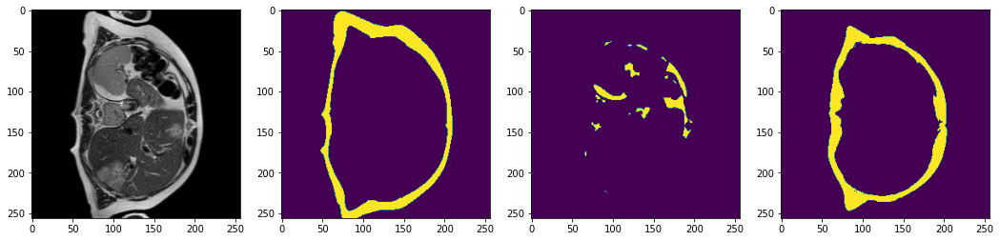

2024-03-28 08:24:16,043 INFO image_writer.py:194 - writing: outMR09fold2/A068_v1_T2W_seg.nii.gz


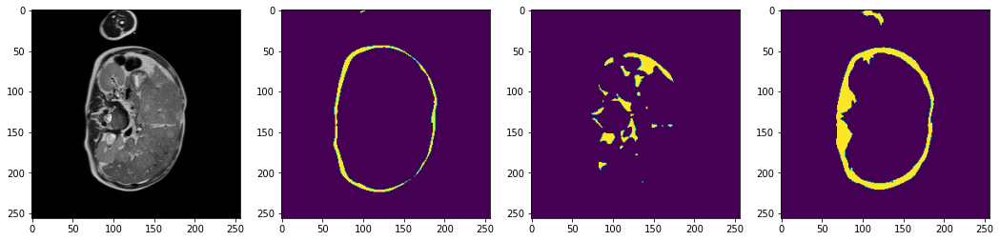

2024-03-28 08:24:18,179 INFO image_writer.py:194 - writing: outMR09fold2/A068_v2_T2W_seg.nii.gz


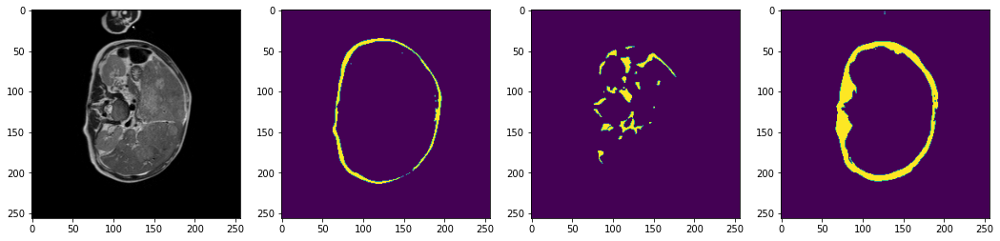

2024-03-28 08:24:23,145 INFO image_writer.py:194 - writing: outMR09fold2/A071_v1_T2W_seg.nii.gz


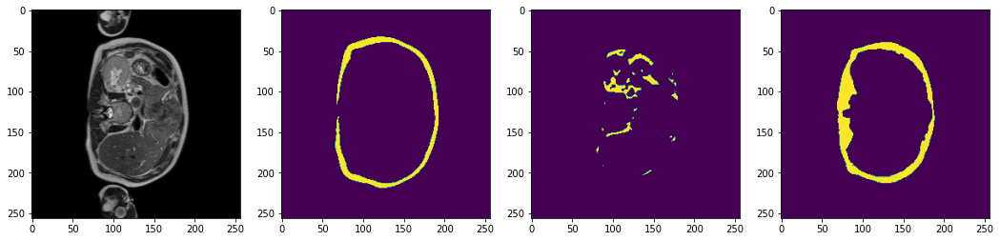

2024-03-28 08:24:28,108 INFO image_writer.py:194 - writing: outMR09fold2/A071_v2_T2W_seg.nii.gz


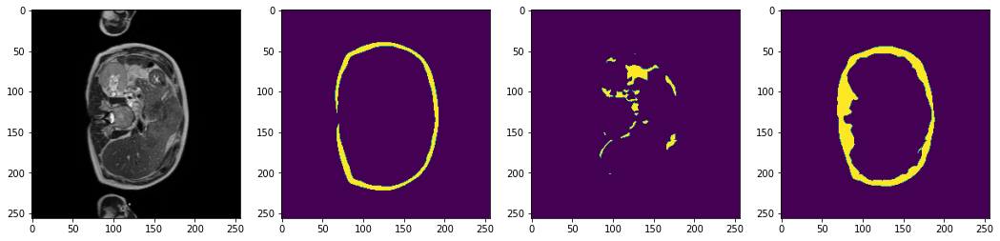

2024-03-28 08:24:33,091 INFO image_writer.py:194 - writing: outMR09fold2/A074_v1_T2W_seg.nii.gz


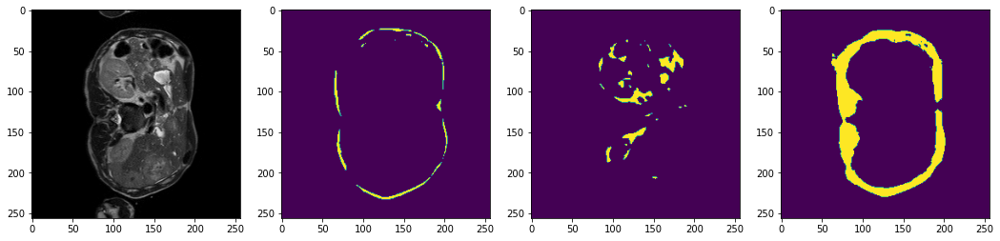

2024-03-28 08:24:38,910 INFO image_writer.py:194 - writing: outMR09fold2/A074_v2_T2W_seg.nii.gz


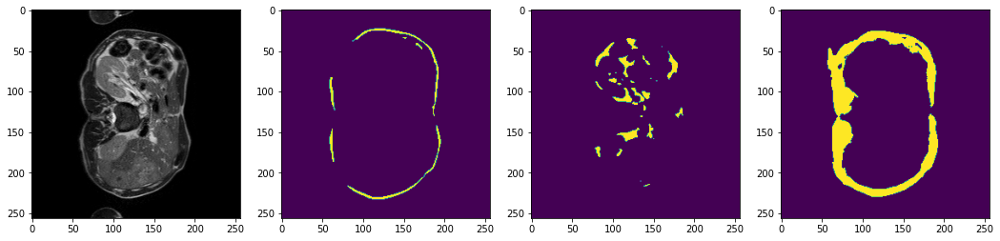

2024-03-28 08:24:41,163 INFO image_writer.py:194 - writing: outMR09fold2/A076_v1_T2W_seg.nii.gz


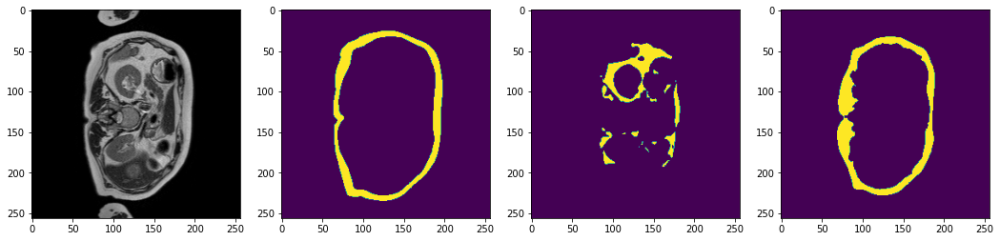

In [ ]:
from monai.transforms import LoadImage
loader = LoadImage()

model.load_state_dict(torch.load(
    os.path.join(root_dir, "TestMR09_unetrensemble_fold2.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (96, 96, 16)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(
            test_inputs, roi_size, sw_batch_size, model, overlap=0.8)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

#         # uncomment the following lines to visualize the predicted results
        test_output = from_engine(["pred"])(test_data)

        original_image = loader(test_data[0]["image_meta_dict"]["filename_or_obj"])[0]

        plt.figure("check", (18, 6))
        plt.subplot(1, 4, 1)
        plt.imshow(original_image[:, :, 8], cmap="gray")
        plt.subplot(1, 4, 2)
        plt.imshow(test_output[0].detach().cpu()[2, :, :, 8])
        plt.subplot(1, 4, 3)
        plt.imshow(test_output[0].detach().cpu()[3, :, :, 8])
        plt.subplot(1, 4, 4)
        plt.imshow(test_output[0].detach().cpu()[5, :, :, 8])
        plt.show()

In [ ]:
!tar -cvzf outMR09fold2.tar.gz outMR09fold2